see the section titled "day 2" for my work
Top left to bottom right diagonal lines along the main diagonal support my argument.


I look at 
x_0 vs x_19
and
x_10 and x_11

which should match for palindromes.

I call each of these paired terms, and the second of these terms from each group, (aka x_19 and x_11, respectively) the target terms.


For Attn Layer 0:
For head 0, we see *attn* at the target term get higher when two paired terms match.  This is a strong effect supporting the mechanism.  (like all analyses here, we see this by looking at the main down-right diagonal).
For head 1, we see *attn* at the target term get lower when two paired terms match. (Not sure if this is a + or a - effect on the mechanism).
(I only tested two target locations, but I think this direction is always the same given some quick matrix mult I did prior to day 2).

For *attn_out*, we see that at target terms, some elements of the length-28 embedding get higher or lower.
This effect is likewise visible in the resid stream after layer 0.

For Attn Layer 1:
For each head, we see *attn* at the last term (the one that will be unembedded) attend a different amount to target terms when they match. 

For *attn_out* at the last term, we see that almost all elements of the length-28 embedding get higher or lower with a match
This effect is likewise visible in the resid stream after layer 1 (and is presumably easy to unembed).




In [1]:
import os; os.environ["ACCELERATE_DISABLE_RICH"] = "1"
import sys
import torch.nn.functional as F


In [2]:
import torch
from pathlib import Path

# Make sure exercises are in the path
chapter = r"chapter1_transformers"
exercises_dir = Path(f"{os.getcwd().split(chapter)[0]}/{chapter}/exercises").resolve()
section_dir = exercises_dir / "monthly_algorithmic_problems" / "july23_palindromes"
if str(exercises_dir) not in sys.path: sys.path.append(str(exercises_dir))

from dataset import PalindromeDataset, display_seq
from model import create_model

device = "cuda" 

In [3]:
filename =  "palindrome_classifier.pt"

model = create_model(
    half_length=10, # this is half the length of the palindrome sequences
    max_value=30, # values in palindrome sequence are between 0 and max_value inclusive
    seed=42,
    d_model=28,
    d_head=14,
    n_heads=2,
    normalization_type="LN",
    d_mlp=None # this is an attn-only model
)

state_dict = torch.load(filename)

state_dict = model.center_writing_weights(torch.load(filename))
state_dict = model.center_unembed(state_dict)
state_dict = model.fold_layer_norm(state_dict)
state_dict = model.fold_value_biases(state_dict)
model.load_state_dict(state_dict, strict=False);

In [4]:
print(model)

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (pos_embed): PosEmbed()
  (hook_pos_embed): HookPoint()
  (hook_tokens): HookPoint()
  (blocks): ModuleList(
    (0-1): 2 x TransformerBlock(
      (ln1): LayerNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): Attention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
      )
      (hook_q_input): HookPoint()
      (hook_k_input): HookPoint()
      (hook_v_input): HookPoint()
      (hook_attn_out): HookPoint()
      (hook_mlp_out): HookPoint()
      (hook_resid_pre): HookPoint()
      (hook_resid_post): HookPoint()
    )
  )
  (ln_final): LayerNorm(
    (hook_scale): HookPoint()
    (hook_normalized): HookPoint()
  )
  (unembed): Unembed()
)


In [5]:
for name, param in model.named_parameters():
    print(f'Layer: {name}')
    print(f'Size: {param.size()}')
    print(f'Mean: {param.mean()}')
    print(f'Standard deviation: {param.std()}')
    print()

Layer: embed.W_E
Size: torch.Size([33, 28])
Mean: -1.2901438251056163e-10
Standard deviation: 0.1571587771177292

Layer: pos_embed.W_pos
Size: torch.Size([22, 28])
Mean: 6.773255289971303e-10
Standard deviation: 0.14186906814575195

Layer: blocks.0.ln1.w
Size: torch.Size([28])
Mean: 1.0
Standard deviation: 0.0

Layer: blocks.0.ln1.b
Size: torch.Size([28])
Mean: 0.0
Standard deviation: 0.0

Layer: blocks.0.attn.W_Q
Size: torch.Size([2, 28, 14])
Mean: 9.123160005231057e-10
Standard deviation: 0.1896062046289444

Layer: blocks.0.attn.W_K
Size: torch.Size([2, 28, 14])
Mean: -6.082106485116867e-10
Standard deviation: 0.191881462931633

Layer: blocks.0.attn.W_V
Size: torch.Size([2, 28, 14])
Mean: -9.123160005231057e-10
Standard deviation: 0.16892792284488678

Layer: blocks.0.attn.W_O
Size: torch.Size([2, 14, 28])
Mean: 1.5205266212792168e-10
Standard deviation: 0.1567966789007187

Layer: blocks.0.attn.b_Q
Size: torch.Size([2, 14])
Mean: 0.0007148864096961915
Standard deviation: 0.08781423419

In [6]:
pos = model.pos_embed.W_pos
W_Q_0 = model.blocks[0].attn.W_Q
W_K_0 = model.blocks[0].attn.W_K

In [7]:
print(pos.shape)
print(W_Q_0.shape)
print(W_K_0.shape)

torch.Size([22, 28])
torch.Size([2, 28, 14])
torch.Size([2, 28, 14])


In [8]:
posQ = torch.einsum("ab,hbd->had",pos,W_Q_0)
posK = torch.einsum("ab,hbd->had",pos,W_K_0)

In [9]:
print(posQ.shape)
print(posK.shape)

torch.Size([2, 22, 14])
torch.Size([2, 22, 14])


In [10]:
embed = model.embed.W_E

In [11]:
embed.shape

torch.Size([33, 28])

In [12]:
eQ = torch.einsum("ab,hbd->had",embed,W_Q_0)
eK = torch.einsum("ab,hbd->had",embed,W_K_0)

In [13]:
print(eK.shape)
print(eQ.shape)
print(posQ.shape)
print(posK.shape)

torch.Size([2, 33, 14])
torch.Size([2, 33, 14])
torch.Size([2, 22, 14])
torch.Size([2, 22, 14])


In [14]:
posQposK = torch.einsum("has,hbs->hab",posQ,posK)
posQeK   = torch.einsum("has,hbs->hab",posQ,eK)
eQposK   = torch.einsum("has,hbs->hab",eQ,posK)
eQeK     = torch.einsum("has,hbs->hab",eQ,eK)

In [15]:
print(posQposK.shape)
print(posQeK.shape)
print(eQposK.shape)
print(eQeK.shape)

torch.Size([2, 22, 22])
torch.Size([2, 22, 33])
torch.Size([2, 33, 22])
torch.Size([2, 33, 33])


In [16]:
eQeK[0]

tensor([[ 0.6760,  0.1497, -0.5854,  ..., -0.2325,  0.0594,  0.0456],
        [ 0.1781,  0.6760, -0.3539,  ..., -0.5085,  0.0547,  0.0814],
        [-0.5832, -0.3515,  0.8344,  ...,  0.3582, -0.1200, -0.1769],
        ...,
        [-0.2954, -0.4737,  0.3735,  ...,  0.7103,  0.2002,  0.1318],
        [ 0.0904,  0.0849, -0.2812,  ..., -0.0969,  0.3308,  0.2005],
        [ 0.0878,  0.1939, -0.3762,  ..., -0.0609,  0.4299,  0.5983]],
       device='cuda:0', grad_fn=<SelectBackward0>)

In [17]:
for i in range(33):
    print (eQeK[0][i][i],eQeK[1][i][i])




tensor(0.6760, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.3232, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.6760, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.1932, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.8344, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.0771, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.5734, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.0104, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.6335, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.2383, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.7300, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.2175, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.9548, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.1007, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.7093, device='cuda:0', grad_fn=<SelectBackward0>) tensor(-0.2967, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4074, device='cuda:0', grad_fn=<SelectB

In [18]:
for i in range(33):
    print (eQposK[0][i])
    print (posQeK[0][:,i])

tensor([-0.1867,  0.0528, -0.1344, -0.1853,  0.0996,  0.1270,  0.0379,  0.0660,
        -0.0041,  0.0528, -0.0199, -0.0058,  0.0796, -0.0175,  0.0396,  0.0141,
         0.0273,  0.1283, -0.0961, -0.0994,  0.1526,  0.0144], device='cuda:0',
       grad_fn=<SelectBackward0>)
tensor([-0.1047,  0.2213,  0.0172, -0.2098,  0.1923,  0.0409, -0.0703, -0.0546,
        -0.1895, -0.1285, -0.1732,  0.0607,  0.1369,  0.1053,  0.1722,  0.1451,
         0.2295,  0.1461, -0.0810, -0.2200,  0.1285,  0.0131], device='cuda:0',
       grad_fn=<SelectBackward0>)
tensor([-0.0063, -0.1397,  0.0627,  0.1013,  0.1722,  0.0113,  0.1232,  0.1413,
        -0.0608, -0.0762, -0.0706, -0.0149,  0.0454, -0.0521,  0.1295,  0.1239,
         0.0953,  0.0154,  0.1097, -0.2272, -0.0677, -0.0565], device='cuda:0',
       grad_fn=<SelectBackward0>)
tensor([ 0.0611,  0.0128,  0.1966,  0.1267,  0.0996, -0.0034,  0.1012,  0.0356,
        -0.1204, -0.1785, -0.0484, -0.0955, -0.0776, -0.1302,  0.0673,  0.1739,
         0.0276,  

In [19]:
print(posQposK[0].shape)

torch.Size([22, 22])


In [20]:
def sm(t,head = 0):
    softmax_x = F.softmax(t, dim=1)

    for i in range(len(softmax_x[head,:])):
        print(softmax_x[head,i,len(softmax_x[head,:])-1-i].item(),softmax_x[head,i,i].item(),1.0/len(softmax_x[head,:]))
        
sm(posQposK, head = 0)
print("\n")
sm(posQposK, head = 1)

0.04220033809542656 0.04813697189092636 0.045454545454545456
0.04131292924284935 0.05700415000319481 0.045454545454545456
0.04853951185941696 0.05349103733897209 0.045454545454545456
0.05600883811712265 0.077326700091362 0.045454545454545456
0.05087682232260704 0.05426029488444328 0.045454545454545456
0.048163264989852905 0.04905074089765549 0.045454545454545456
0.05393274500966072 0.05788436532020569 0.045454545454545456
0.04908633232116699 0.05085084214806557 0.045454545454545456
0.05618169158697128 0.05932523310184479 0.045454545454545456
0.046964146196842194 0.04899287596344948 0.045454545454545456
0.04689360409975052 0.04689367860555649 0.045454545454545456
0.05607190355658531 0.05454808101058006 0.045454545454545456
0.05491723120212555 0.05329049751162529 0.045454545454545456
0.07382707297801971 0.06796291470527649 0.045454545454545456
0.05579346790909767 0.05175413563847542 0.045454545454545456
0.06151909381151199 0.05559908226132393 0.045454545454545456
0.05394649878144264 0.05

In [21]:
sm(eQeK, head = 0)
print("\n")
sm(eQeK, head = 1)

0.029927674680948257 0.057553958147764206 0.030303030303030304
0.02956506796181202 0.05717065557837486 0.030303030303030304
0.041582416743040085 0.0683622881770134 0.030303030303030304
0.025395909324288368 0.05256747454404831 0.030303030303030304
0.03851884976029396 0.05353100225329399 0.030303030303030304
0.042634017765522 0.06104924529790878 0.030303030303030304
0.02427445352077484 0.06824932247400284 0.030303030303030304
0.036071695387363434 0.056508272886276245 0.030303030303030304
0.03512603044509888 0.04426930472254753 0.030303030303030304
0.0337175652384758 0.05157439410686493 0.030303030303030304
0.035109035670757294 0.0556444488465786 0.030303030303030304
0.0398169681429863 0.05640474706888199 0.030303030303030304
0.02796383947134018 0.05565190687775612 0.030303030303030304
0.01720515638589859 0.06008053570985794 0.030303030303030304
0.029545333236455917 0.044478751718997955 0.030303030303030304
0.0301131010055542 0.05501474067568779 0.030303030303030304
0.052185770124197006 0

In [22]:
pos = model.pos_embed.W_pos
W_Q_0 = model.blocks[0].attn.W_Q
W_K_0 = model.blocks[0].attn.W_K

In [23]:
W_V_0 = model.blocks[0].attn.W_V
posV = torch.einsum("ab,hbd->had",pos,W_V_0)
eV = torch.einsum("ab,hbd->had",embed,W_V_0)


In [24]:
print(posV.shape)
print(eV.shape)

torch.Size([2, 22, 14])
torch.Size([2, 33, 14])


In [25]:
W_O_0 = model.blocks[0].attn.W_O

In [26]:
print(W_O_0.shape)

torch.Size([2, 14, 28])


In [27]:
posVO = torch.einsum("hbd,hde->hbe",posV,W_O_0)
embedVO = torch.einsum("hbd,hde->hbe",eV,W_O_0)

In [28]:
print(posVO.shape)
print(pos.shape)

torch.Size([2, 22, 28])
torch.Size([22, 28])


In [29]:
posVO_dot_pos = torch.einsum("bd,hcd->hbc",pos,posVO)


In [30]:
print(posVO_dot_pos.shape)

torch.Size([2, 22, 22])


In [31]:
print(posVO_dot_pos[0])

tensor([[-2.6742e-03, -5.2213e-02, -1.6286e-02, -1.4030e-02, -3.7823e-02,
          8.0647e-02,  1.0102e-01,  6.8285e-02,  9.4974e-02,  7.3750e-02,
          8.1758e-02, -1.4995e-01, -1.2421e-01, -1.3797e-01, -1.5540e-01,
         -8.8835e-02, -1.1105e-01,  1.5202e-03, -1.5726e-01,  5.6812e-02,
          2.0316e-01, -4.4907e-03],
        [-6.3490e-02,  5.2651e-02,  3.0798e-02,  3.2647e-04, -2.5036e-03,
         -1.4060e-01, -3.3758e-02, -1.2493e-01, -1.0173e-01, -1.4750e-01,
         -1.5886e-01,  1.3343e-01,  1.4045e-01,  2.1406e-01,  1.7625e-01,
          1.6536e-01,  1.1024e-01, -8.7522e-04,  2.5459e-01, -6.0746e-03,
         -1.7745e-01,  4.8598e-02],
        [-4.0126e-03, -3.7752e-02,  5.1070e-02,  4.9976e-02,  6.0748e-03,
          6.9877e-02,  1.2541e-01,  8.7293e-02,  1.7220e-01,  5.5974e-02,
          8.1060e-02, -1.1469e-01, -1.3668e-01, -1.4047e-01, -1.6686e-01,
         -1.1519e-01, -1.9160e-01,  6.0266e-02, -1.2582e-01,  1.2696e-01,
          1.7016e-02, -2.0874e-04],
    

In [32]:
embedVO_dot_embed = torch.einsum("bd,hcd->hbc",embed,embedVO)

In [33]:
for i in range(33):
    print(embedVO_dot_embed[0][i,i])

tensor(0.0143, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.0461, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.0371, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.0148, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.1199, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.1281, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.0292, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.0496, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.0883, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.0112, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.0599, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.1390, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.0925, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.0392, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(-0.1022, device='cuda:0', grad_fn=<Selec

In [34]:
for i in range(len(embedVO[0])):
    print (embedVO[0])

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

tensor([[ 1.6471e-01,  5.8368e-02,  7.7429e-03, -4.5699e-02, -3.4962e-02,
          6.6208e-02,  2.4990e-02,  3.9476e-03,  1.7549e-01, -1.7753e-01,
          2.6012e-02, -1.1484e-01,  1.2275e-02, -4.0527e-02, -3.2013e-02,
          3.3033e-02, -6.6311e-02, -2.5288e-02, -4.8666e-02,  7.4704e-03,
         -7.1462e-03, -2.1690e-02,  1.1071e-01, -1.1900e-01, -6.4086e-03,
          7.9624e-02, -1.9609e-01,  1.6559e-01],
        [ 1.8163e-01,  2.1582e-02,  6.8663e-02, -1.6262e-01,  8.7237e-02,
         -1.3401e-01, -1.6033e-01, -1.0989e-01,  9.8009e-03, -1.4589e-01,
         -5.7892e-02,  1.0733e-01,  1.1045e-01, -1.4080e-01,  4.8513e-02,
          1.0200e-01,  2.4905e-02,  8.5913e-02,  8.2155e-02,  7.2130e-02,
          1.0003e-01, -7.8589e-02,  2.3100e-02, -2.1622e-03, -9.2117e-02,
          1.1790e-01, -3.5171e-02, -1.2388e-01],
        [-9.4776e-03,  2.4892e-02, -1.6002e-02, -2.7711e-02, -2.4178e-02,
         -1.2911e-02, -1.3358e-02, -5.6380e-03, -7.1792e-02, -5.3338e-02,
         -6.82

In [35]:
print(W_V_0.shape)
print(W_O_0.shape)

torch.Size([2, 28, 14])
torch.Size([2, 14, 28])


In [36]:
VO = torch.einsum("hab,hbc->hac",W_V_0,W_O_0)

In [37]:
print(VO.shape)

torch.Size([2, 28, 28])


In [38]:
VO[0]

tensor([[-1.4129e-01, -7.3443e-03, -8.7054e-02,  1.2102e-03,  1.0176e-02,
          8.2912e-02,  3.5598e-02,  1.3556e-01,  1.2376e-02,  1.2380e-01,
          4.6822e-02, -1.4186e-01,  7.3697e-02,  4.7517e-02,  4.8027e-02,
         -2.1459e-01,  3.2121e-02,  3.8791e-03, -7.9833e-02, -7.2145e-03,
         -4.5281e-02,  5.4345e-02, -1.6426e-02, -8.4803e-02,  6.3423e-02,
         -7.9487e-02,  6.9036e-02,  6.4688e-02],
        [ 1.2798e-01,  3.7046e-02,  1.6409e-02, -1.3487e-01,  1.7485e-01,
         -5.7222e-02, -1.4311e-01, -7.4744e-02,  3.1462e-01, -1.1862e-01,
         -1.5809e-01, -2.1878e-01,  1.0325e-01, -2.1053e-02,  6.1158e-02,
          4.8914e-02,  1.4679e-01, -1.9891e-02,  3.7779e-02,  8.8987e-02,
         -1.3886e-02, -1.8989e-02,  1.5809e-02, -3.0229e-02, -2.7868e-01,
          2.5675e-01,  4.4732e-02, -1.8691e-01],
        [ 9.3511e-02,  9.2673e-02, -4.2763e-02, -2.6933e-02, -3.9373e-02,
          8.4631e-02,  1.7135e-02,  3.8861e-02,  1.2847e-01, -1.1697e-01,
          8.52

## day 2

In [164]:
import torch

X = torch.zeros((2, 31 * 31, 22), dtype=torch.int )
Y = torch.zeros((2, 31 * 31), dtype=torch.int)

for i in range(31):
    for j in range(31):
        X[0, 31*i+j] = torch.tensor([31, i,  2, 20, 18, 29,  8,  4, 10, 13, 12, 12, 13, 10,  4,  8, 29, 18,
         20,  2, j, 32], dtype=torch.int)
        Y[0, 31*i+j] = (i == j)
        
        X[1,31*i+j] = torch.tensor([31, 4,  9, 20, 18, 29,  8,  4, 10, 13, i, j, 13, 10,  4,  8, 29, 18,
         20,  9, 4, 32], dtype=torch.int)
        Y[1,31*i+j] = (i == j)        
        

In [166]:
logits = model(X.reshape(-1,22))[:, -1]
probs = logits.softmax(-1)
probs_palindrome = probs[:, 1]

for tok, prob in zip(X.reshape(-1,22), probs_palindrome.reshape(-1)):
    display_seq(tok, prob)

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.992

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.466

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.160

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.006

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |00|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.995

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.049

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.002

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.377

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.876

START |01|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.992

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.003

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.016

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.017

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.104

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.089

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.001

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |02|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.002

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.991

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.002

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.004

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.001

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |03|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.996

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.002

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.002

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.801

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.002

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.008

START |04|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.003

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.001

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.994

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.607

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.112

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.001

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.003

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.036

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.009

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.028

START |05|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.996

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.003

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.011

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |06|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.992

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.006

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.001

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.032

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.000

START |07|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.017

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.003

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.992

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.016

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.003

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.006

START |08|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.001

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.001

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.995

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.012

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.002

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.001

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.013

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |09|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.993

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.002

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |10|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.992

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.002

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.648

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |11|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.002

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.002

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.995

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.002

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.037

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.013

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.001

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |12|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.003

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.001

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.002

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.997

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.002

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |13|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.002

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.989

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |14|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.995

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.004

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.001

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.004

START |15|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.993

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.012

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |16|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.001

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.001

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.004

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.002

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.003

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.979

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.038

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.001

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |17|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.001

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.002

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.002

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.994

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |18|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.001

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.001

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.002

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.005

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.002

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.079

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.002

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.002

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.004

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.006

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.992

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.007

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.003

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.010

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.004

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |19|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.003

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.988

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.002

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.567

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.001

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.000

START |20|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.010

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.991

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |21|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.001

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.043

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.001

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.004

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.994

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.020

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.000

START |22|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.003

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.002

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.002

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.002

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.996

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.001

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.002

START |23|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.002

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.002

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.002

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.040

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.002

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.003

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.280

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.009

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.028

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.993

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |24|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.007

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.002

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.995

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.001

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |25|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.019

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.002

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.029

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.002

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.972

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.005

START |26|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.001

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.001

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.109

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.047

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.002

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.015

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.010

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.994

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |27|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.005

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.001

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.020

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.014

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.002

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.004

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.988

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.009

START |28|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.595

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.006

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.002

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.258

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.002

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.001

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.996

START |29|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|00| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|01| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|02| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|03| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|04| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|05| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|06| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|07| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|08| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|09| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|10| END  ->  0.002

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|11| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|12| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|13| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|14| END  ->  0.058

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|15| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|16| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|17| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|18| END  ->  0.003

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|19| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|20| END  ->  0.006

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|21| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|22| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|23| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|24| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|25| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|26| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|27| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|28| END  ->  0.000

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|29| END  ->  0.001

START |30|02|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|02|30| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|00|00|13|10|04|08|29|18|20|09|04| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|00|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|04|13|10|04|08|29|18|20|09|04| END  ->  0.005

START |04|09|20|18|29|08|04|10|13|00|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|13|13|10|04|08|29|18|20|09|04| END  ->  0.248

START |04|09|20|18|29|08|04|10|13|00|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|00|29|13|10|04|08|29|18|20|09|04| END  ->  0.141

START |04|09|20|18|29|08|04|10|13|00|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|01|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|01|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|04|13|10|04|08|29|18|20|09|04| END  ->  0.006

START |04|09|20|18|29|08|04|10|13|01|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|13|13|10|04|08|29|18|20|09|04| END  ->  0.543

START |04|09|20|18|29|08|04|10|13|01|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|01|29|13|10|04|08|29|18|20|09|04| END  ->  0.956

START |04|09|20|18|29|08|04|10|13|01|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|02|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|02|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|02|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|10|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|02|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|13|13|10|04|08|29|18|20|09|04| END  ->  0.501

START |04|09|20|18|29|08|04|10|13|02|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|02|29|13|10|04|08|29|18|20|09|04| END  ->  0.235

START |04|09|20|18|29|08|04|10|13|02|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|03|13|10|04|08|29|18|20|09|04| END  ->  0.994

START |04|09|20|18|29|08|04|10|13|03|04|13|10|04|08|29|18|20|09|04| END  ->  0.003

START |04|09|20|18|29|08|04|10|13|03|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|13|13|10|04|08|29|18|20|09|04| END  ->  0.116

START |04|09|20|18|29|08|04|10|13|03|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|03|29|13|10|04|08|29|18|20|09|04| END  ->  0.074

START |04|09|20|18|29|08|04|10|13|03|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|04|13|10|04|08|29|18|20|09|04| END  ->  0.997

START |04|09|20|18|29|08|04|10|13|04|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|13|13|10|04|08|29|18|20|09|04| END  ->  0.949

START |04|09|20|18|29|08|04|10|13|04|14|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|04|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|04|29|13|10|04|08|29|18|20|09|04| END  ->  0.930

START |04|09|20|18|29|08|04|10|13|04|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|05|05|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|05|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|10|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|05|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|13|13|10|04|08|29|18|20|09|04| END  ->  0.500

START |04|09|20|18|29|08|04|10|13|05|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|05|29|13|10|04|08|29|18|20|09|04| END  ->  0.610

START |04|09|20|18|29|08|04|10|13|05|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|04|13|10|04|08|29|18|20|09|04| END  ->  0.117

START |04|09|20|18|29|08|04|10|13|06|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|06|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|06|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|10|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|06|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|13|13|10|04|08|29|18|20|09|04| END  ->  0.787

START |04|09|20|18|29|08|04|10|13|06|14|13|10|04|08|29|18|20|09|04| END  ->  0.005

START |04|09|20|18|29|08|04|10|13|06|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|18|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|06|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|25|13|10|04|08|29|18|20|09|04| END  ->  0.064

START |04|09|20|18|29|08|04|10|13|06|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|06|29|13|10|04|08|29|18|20|09|04| END  ->  0.023

START |04|09|20|18|29|08|04|10|13|06|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|04|13|10|04|08|29|18|20|09|04| END  ->  0.007

START |04|09|20|18|29|08|04|10|13|07|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|07|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|07|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|10|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|07|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|13|13|10|04|08|29|18|20|09|04| END  ->  0.693

START |04|09|20|18|29|08|04|10|13|07|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|18|13|10|04|08|29|18|20|09|04| END  ->  0.629

START |04|09|20|18|29|08|04|10|13|07|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|21|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|07|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|07|29|13|10|04|08|29|18|20|09|04| END  ->  0.248

START |04|09|20|18|29|08|04|10|13|07|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|08|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|08|13|10|04|08|29|18|20|09|04| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|08|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|13|13|10|04|08|29|18|20|09|04| END  ->  0.364

START |04|09|20|18|29|08|04|10|13|08|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|08|29|13|10|04|08|29|18|20|09|04| END  ->  0.791

START |04|09|20|18|29|08|04|10|13|08|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|09|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|09|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|09|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|13|13|10|04|08|29|18|20|09|04| END  ->  0.453

START |04|09|20|18|29|08|04|10|13|09|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|09|29|13|10|04|08|29|18|20|09|04| END  ->  0.186

START |04|09|20|18|29|08|04|10|13|09|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|04|13|10|04|08|29|18|20|09|04| END  ->  0.003

START |04|09|20|18|29|08|04|10|13|10|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|10|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|10|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|13|13|10|04|08|29|18|20|09|04| END  ->  0.491

START |04|09|20|18|29|08|04|10|13|10|14|13|10|04|08|29|18|20|09|04| END  ->  0.011

START |04|09|20|18|29|08|04|10|13|10|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|10|29|13|10|04|08|29|18|20|09|04| END  ->  0.163

START |04|09|20|18|29|08|04|10|13|10|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|04|13|10|04|08|29|18|20|09|04| END  ->  0.007

START |04|09|20|18|29|08|04|10|13|11|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|11|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|11|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|13|13|10|04|08|29|18|20|09|04| END  ->  0.536

START |04|09|20|18|29|08|04|10|13|11|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|11|29|13|10|04|08|29|18|20|09|04| END  ->  0.464

START |04|09|20|18|29|08|04|10|13|11|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|01|13|10|04|08|29|18|20|09|04| END  ->  0.704

START |04|09|20|18|29|08|04|10|13|12|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|04|13|10|04|08|29|18|20|09|04| END  ->  0.006

START |04|09|20|18|29|08|04|10|13|12|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|12|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|12|13|13|10|04|08|29|18|20|09|04| END  ->  0.144

START |04|09|20|18|29|08|04|10|13|12|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|18|13|10|04|08|29|18|20|09|04| END  ->  0.876

START |04|09|20|18|29|08|04|10|13|12|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|12|29|13|10|04|08|29|18|20|09|04| END  ->  0.142

START |04|09|20|18|29|08|04|10|13|12|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|04|13|10|04|08|29|18|20|09|04| END  ->  0.982

START |04|09|20|18|29|08|04|10|13|13|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|13|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|13|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|13|29|13|10|04|08|29|18|20|09|04| END  ->  0.889

START |04|09|20|18|29|08|04|10|13|13|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|04|13|10|04|08|29|18|20|09|04| END  ->  0.030

START |04|09|20|18|29|08|04|10|13|14|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|13|13|10|04|08|29|18|20|09|04| END  ->  0.618

START |04|09|20|18|29|08|04|10|13|14|14|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|14|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|26|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|14|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|14|29|13|10|04|08|29|18|20|09|04| END  ->  0.837

START |04|09|20|18|29|08|04|10|13|14|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|15|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|13|13|10|04|08|29|18|20|09|04| END  ->  0.104

START |04|09|20|18|29|08|04|10|13|15|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|15|13|10|04|08|29|18|20|09|04| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|15|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|15|29|13|10|04|08|29|18|20|09|04| END  ->  0.716

START |04|09|20|18|29|08|04|10|13|15|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|04|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|16|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|13|13|10|04|08|29|18|20|09|04| END  ->  0.151

START |04|09|20|18|29|08|04|10|13|16|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|16|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|16|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|16|29|13|10|04|08|29|18|20|09|04| END  ->  0.060

START |04|09|20|18|29|08|04|10|13|16|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|17|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|08|13|10|04|08|29|18|20|09|04| END  ->  0.005

START |04|09|20|18|29|08|04|10|13|17|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|10|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|17|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|13|13|10|04|08|29|18|20|09|04| END  ->  0.157

START |04|09|20|18|29|08|04|10|13|17|14|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|17|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|17|13|10|04|08|29|18|20|09|04| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|17|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|17|29|13|10|04|08|29|18|20|09|04| END  ->  0.204

START |04|09|20|18|29|08|04|10|13|17|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|04|13|10|04|08|29|18|20|09|04| END  ->  0.022

START |04|09|20|18|29|08|04|10|13|18|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|11|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|18|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|13|13|10|04|08|29|18|20|09|04| END  ->  0.619

START |04|09|20|18|29|08|04|10|13|18|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|18|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|18|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|18|29|13|10|04|08|29|18|20|09|04| END  ->  0.243

START |04|09|20|18|29|08|04|10|13|18|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|04|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|19|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|13|13|10|04|08|29|18|20|09|04| END  ->  0.180

START |04|09|20|18|29|08|04|10|13|19|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|19|13|10|04|08|29|18|20|09|04| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|19|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|19|29|13|10|04|08|29|18|20|09|04| END  ->  0.047

START |04|09|20|18|29|08|04|10|13|19|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|04|13|10|04|08|29|18|20|09|04| END  ->  0.011

START |04|09|20|18|29|08|04|10|13|20|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|10|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|20|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|13|13|10|04|08|29|18|20|09|04| END  ->  0.607

START |04|09|20|18|29|08|04|10|13|20|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|20|13|10|04|08|29|18|20|09|04| END  ->  0.997

START |04|09|20|18|29|08|04|10|13|20|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|20|29|13|10|04|08|29|18|20|09|04| END  ->  0.494

START |04|09|20|18|29|08|04|10|13|20|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|21|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|10|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|21|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|13|13|10|04|08|29|18|20|09|04| END  ->  0.531

START |04|09|20|18|29|08|04|10|13|21|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|21|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|21|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|21|29|13|10|04|08|29|18|20|09|04| END  ->  0.235

START |04|09|20|18|29|08|04|10|13|21|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|04|13|10|04|08|29|18|20|09|04| END  ->  0.003

START |04|09|20|18|29|08|04|10|13|22|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|10|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|22|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|13|13|10|04|08|29|18|20|09|04| END  ->  0.335

START |04|09|20|18|29|08|04|10|13|22|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|22|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|22|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|22|29|13|10|04|08|29|18|20|09|04| END  ->  0.284

START |04|09|20|18|29|08|04|10|13|22|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|04|13|10|04|08|29|18|20|09|04| END  ->  0.006

START |04|09|20|18|29|08|04|10|13|23|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|13|13|10|04|08|29|18|20|09|04| END  ->  0.674

START |04|09|20|18|29|08|04|10|13|23|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|23|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|23|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|23|29|13|10|04|08|29|18|20|09|04| END  ->  0.317

START |04|09|20|18|29|08|04|10|13|23|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|04|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|24|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|13|13|10|04|08|29|18|20|09|04| END  ->  0.209

START |04|09|20|18|29|08|04|10|13|24|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|24|13|10|04|08|29|18|20|09|04| END  ->  0.995

START |04|09|20|18|29|08|04|10|13|24|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|24|29|13|10|04|08|29|18|20|09|04| END  ->  0.083

START |04|09|20|18|29|08|04|10|13|24|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|25|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|08|13|10|04|08|29|18|20|09|04| END  ->  0.333

START |04|09|20|18|29|08|04|10|13|25|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|10|13|10|04|08|29|18|20|09|04| END  ->  0.008

START |04|09|20|18|29|08|04|10|13|25|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|13|13|10|04|08|29|18|20|09|04| END  ->  0.906

START |04|09|20|18|29|08|04|10|13|25|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|23|13|10|04|08|29|18|20|09|04| END  ->  0.011

START |04|09|20|18|29|08|04|10|13|25|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|25|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|25|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|25|29|13|10|04|08|29|18|20|09|04| END  ->  0.307

START |04|09|20|18|29|08|04|10|13|25|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|04|13|10|04|08|29|18|20|09|04| END  ->  0.002

START |04|09|20|18|29|08|04|10|13|26|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|13|13|10|04|08|29|18|20|09|04| END  ->  0.227

START |04|09|20|18|29|08|04|10|13|26|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|26|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|26|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|26|29|13|10|04|08|29|18|20|09|04| END  ->  0.223

START |04|09|20|18|29|08|04|10|13|26|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|27|05|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|27|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|10|13|10|04|08|29|18|20|09|04| END  ->  0.985

START |04|09|20|18|29|08|04|10|13|27|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|13|13|10|04|08|29|18|20|09|04| END  ->  0.917

START |04|09|20|18|29|08|04|10|13|27|14|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|27|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|27|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|27|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|27|29|13|10|04|08|29|18|20|09|04| END  ->  0.470

START |04|09|20|18|29|08|04|10|13|27|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|04|13|10|04|08|29|18|20|09|04| END  ->  0.025

START |04|09|20|18|29|08|04|10|13|28|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|13|13|10|04|08|29|18|20|09|04| END  ->  0.276

START |04|09|20|18|29|08|04|10|13|28|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|28|28|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|28|29|13|10|04|08|29|18|20|09|04| END  ->  0.101

START |04|09|20|18|29|08|04|10|13|28|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|04|13|10|04|08|29|18|20|09|04| END  ->  0.007

START |04|09|20|18|29|08|04|10|13|29|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|10|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|13|13|10|04|08|29|18|20|09|04| END  ->  0.481

START |04|09|20|18|29|08|04|10|13|29|14|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|19|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|29|29|13|10|04|08|29|18|20|09|04| END  ->  0.996

START |04|09|20|18|29|08|04|10|13|29|30|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|00|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|01|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|02|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|03|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|04|13|10|04|08|29|18|20|09|04| END  ->  0.004

START |04|09|20|18|29|08|04|10|13|30|05|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|06|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|07|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|08|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|09|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|10|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|30|11|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|12|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|13|13|10|04|08|29|18|20|09|04| END  ->  0.284

START |04|09|20|18|29|08|04|10|13|30|14|13|10|04|08|29|18|20|09|04| END  ->  0.003

START |04|09|20|18|29|08|04|10|13|30|15|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|16|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|17|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|18|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|19|13|10|04|08|29|18|20|09|04| END  ->  0.001

START |04|09|20|18|29|08|04|10|13|30|20|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|21|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|22|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|23|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|24|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|25|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|26|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|27|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|28|13|10|04|08|29|18|20|09|04| END  ->  0.000

START |04|09|20|18|29|08|04|10|13|30|29|13|10|04|08|29|18|20|09|04| END  ->  0.059

START |04|09|20|18|29|08|04|10|13|30|30|13|10|04|08|29|18|20|09|04| END  ->  0.995

In [84]:
from collections import defaultdict

activations = defaultdict(dict)
model.cache_all(activations, incl_bwd=False)
with torch.no_grad():
    output = model(X.reshape(-1,22))



In [86]:
reshaped_attn_0 = activations['blocks.0.attn.hook_attn_scores'].reshape(2,31*31,2,22,22)
print(reshaped_attn_0.shape)
print("dataset, points, head, across, vertical")

torch.Size([2, 961, 2, 22, 22])
dataset, points, head, across, vertical


In [119]:
import matplotlib.pyplot as plt
import torch

def plot_heatmap(tensor, title = "blank"):
    tensor = tensor.detach().cpu().numpy()
#     if tensor.shape != torch.Size([31, 31]):
#         raise ValueError('Expected a tensor of shape (31, 31), but got tensor with shape {}.'.format(tensor.shape))
    
    # Plotting
    plt.figure(figsize=(8, 8))
    plt.imshow(tensor, cmap='coolwarm', interpolation='nearest')
    plt.title(title)
    plt.colorbar()
    plt.show()


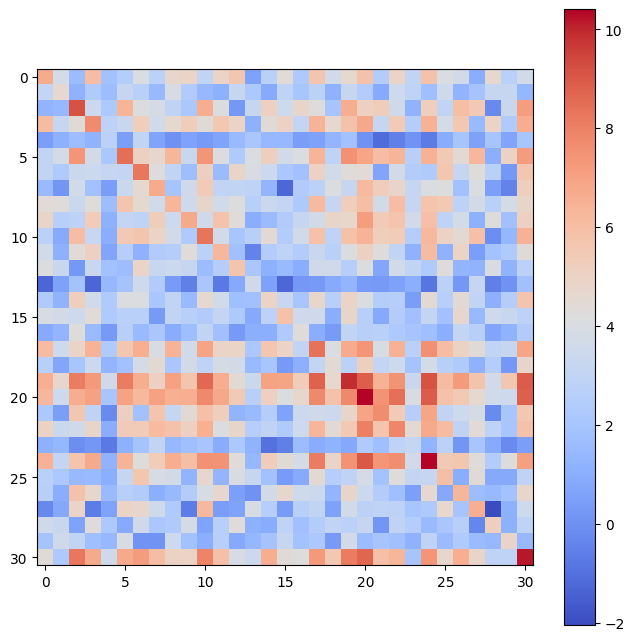

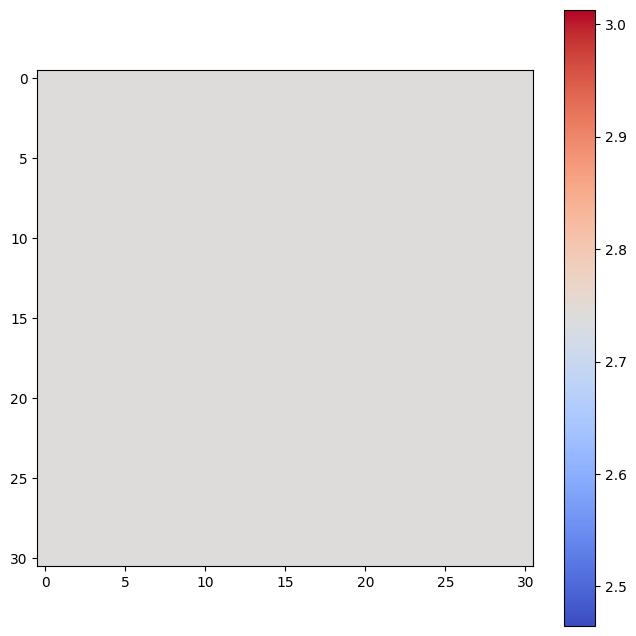

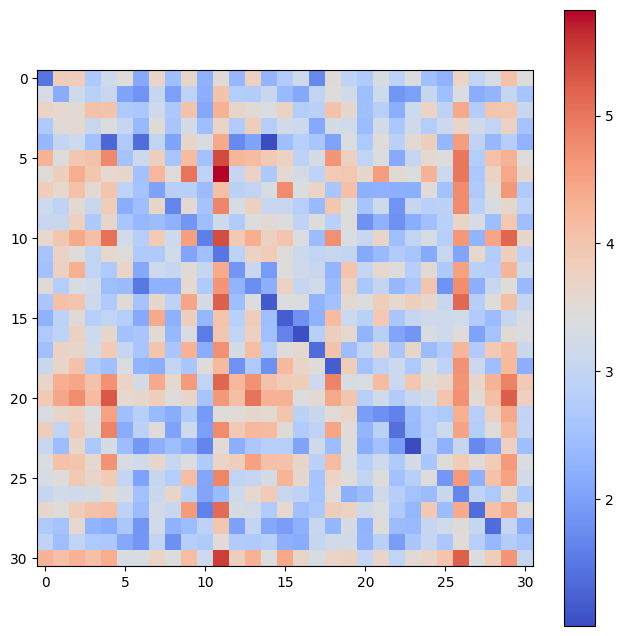

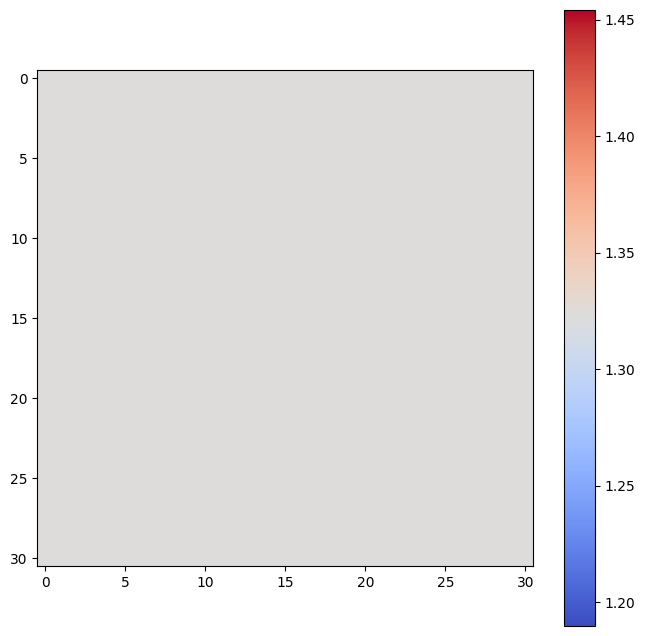

In [106]:
# Heads that should match for A form red line.
plot_attn0_hms(reshaped_attn_0[0], 0, -2, 1)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 0, -2, 1)

# Head 2 reverse effect?
plot_attn0_hms(reshaped_attn_0[0], 1, -2, 1)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 1, -2, 1)


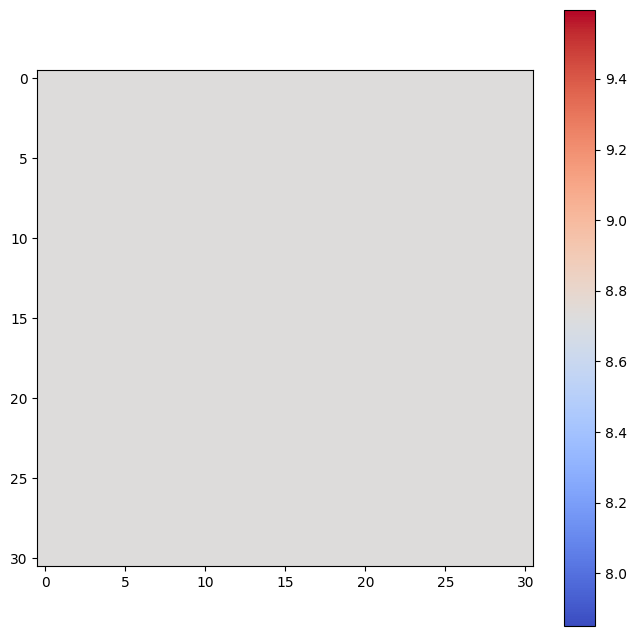

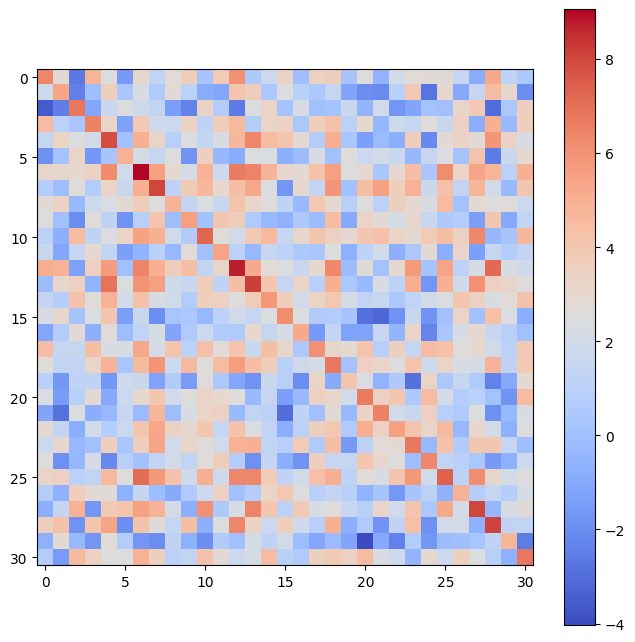

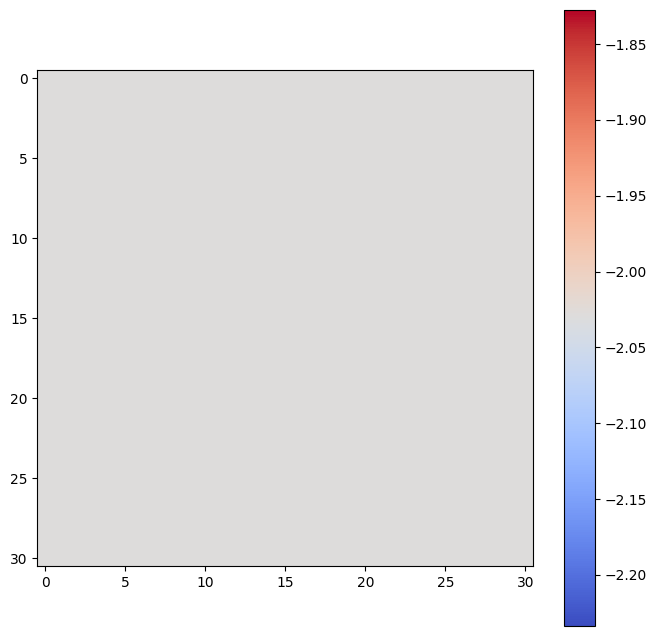

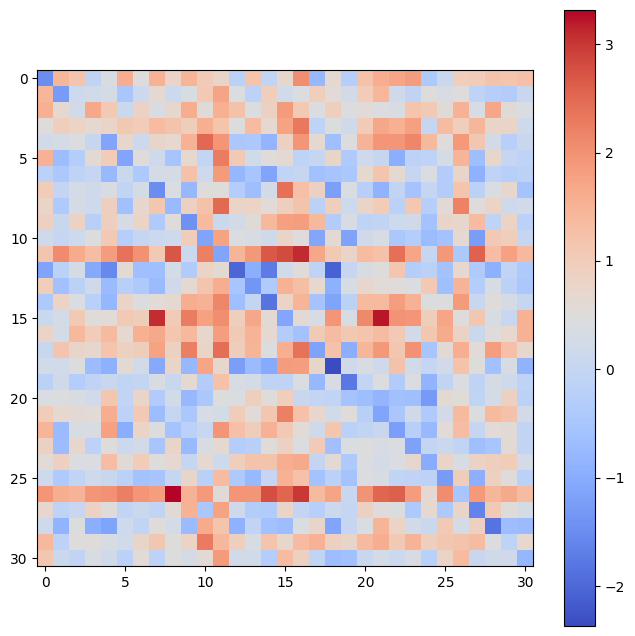

In [107]:
# REVERSED

# Heads that should match for A form red line.
plot_attn0_hms(reshaped_attn_0[0], 0, -11, 10)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 0, -11, 10)

# Head 2 reverse effect?
plot_attn0_hms(reshaped_attn_0[0], 1, -11, 10)
# But not for B
plot_attn0_hms(reshaped_attn_0[1], 1, -11, 10)

In [110]:
for key, value in activations.items():
    print(f"Key: {key}")
    print(f"Shape: {value.shape}")

Key: hook_tokens
Shape: torch.Size([1922, 22])
Key: hook_embed
Shape: torch.Size([1922, 22, 28])
Key: hook_pos_embed
Shape: torch.Size([1922, 22, 28])
Key: blocks.0.hook_resid_pre
Shape: torch.Size([1922, 22, 28])
Key: blocks.0.hook_q_input
Shape: torch.Size([1922, 22, 2, 28])
Key: blocks.0.hook_k_input
Shape: torch.Size([1922, 22, 2, 28])
Key: blocks.0.hook_v_input
Shape: torch.Size([1922, 22, 2, 28])
Key: blocks.0.ln1.hook_scale
Shape: torch.Size([1922, 22, 2, 1])
Key: blocks.0.ln1.hook_normalized
Shape: torch.Size([1922, 22, 2, 28])
Key: blocks.0.attn.hook_q
Shape: torch.Size([1922, 22, 2, 14])
Key: blocks.0.attn.hook_k
Shape: torch.Size([1922, 22, 2, 14])
Key: blocks.0.attn.hook_v
Shape: torch.Size([1922, 22, 2, 14])
Key: blocks.0.attn.hook_attn_scores
Shape: torch.Size([1922, 2, 22, 22])
Key: blocks.0.attn.hook_pattern
Shape: torch.Size([1922, 2, 22, 22])
Key: blocks.0.attn.hook_z
Shape: torch.Size([1922, 22, 2, 14])
Key: blocks.0.attn.hook_result
Shape: torch.Size([1922, 22, 2, 2

In [ ]:
Key: 
Shape: torch.Size([1922, 22, 28])

In [ ]:
plot_heatmap

In [115]:
reshaped_attn_out_0 = activations['blocks.0.hook_attn_out'].reshape(2,31,31,22,28)


In [116]:
print(reshaped_attn_out_0.shape)

torch.Size([2, 31, 31, 22, 28])


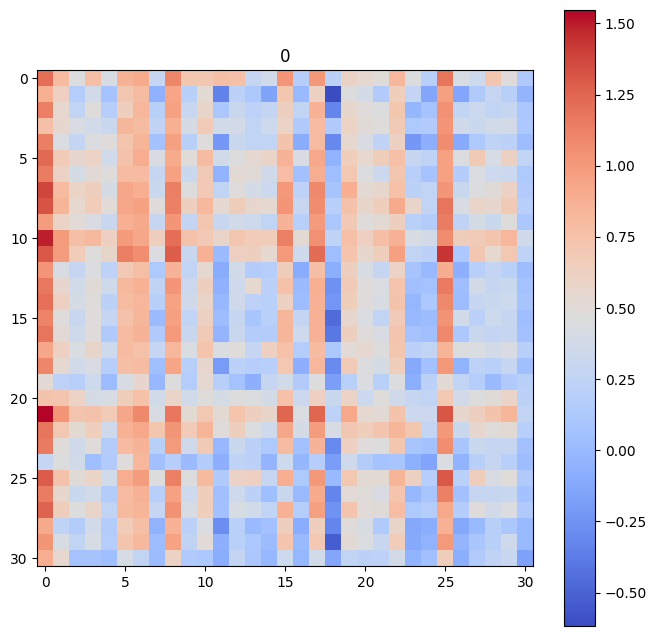

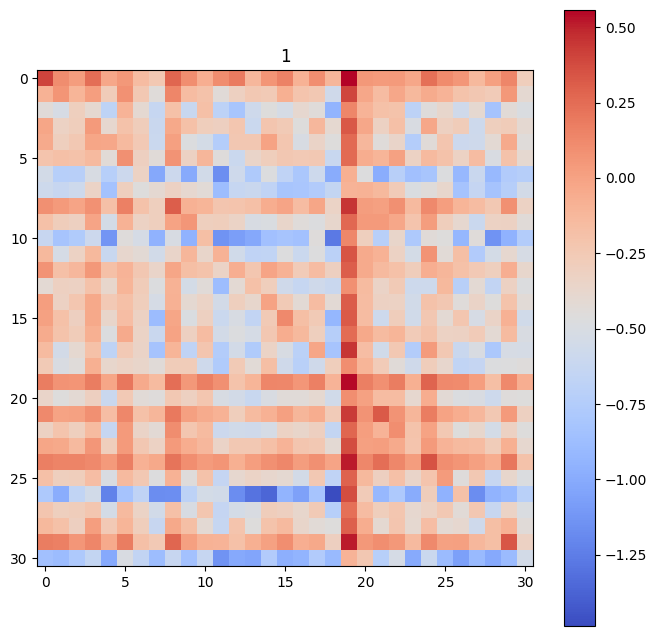

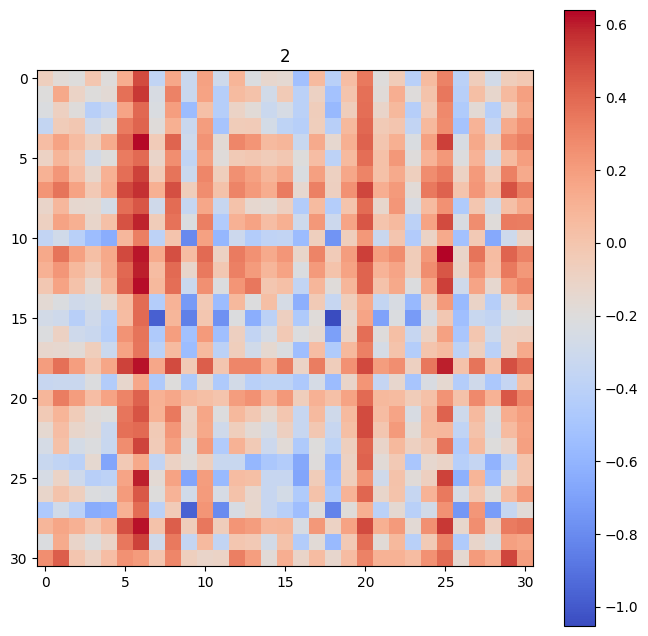

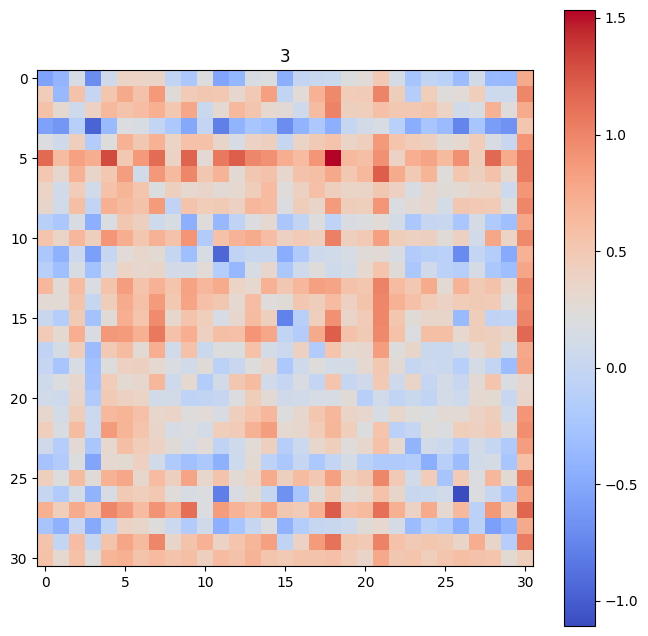

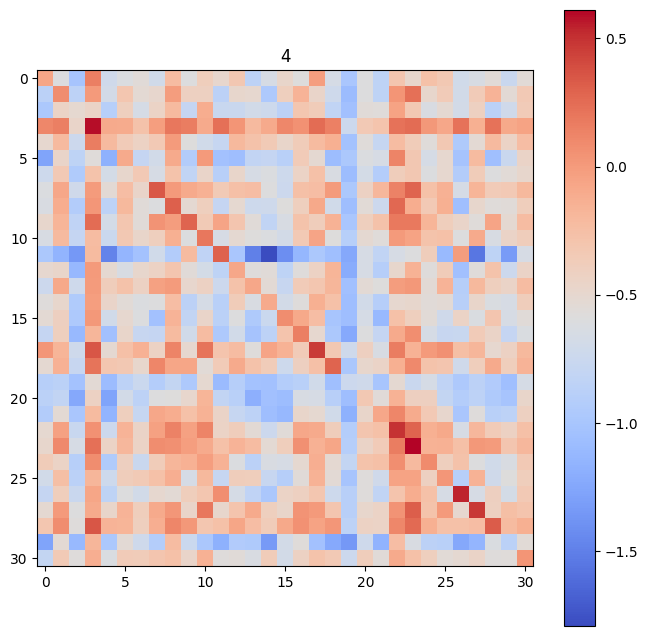

...

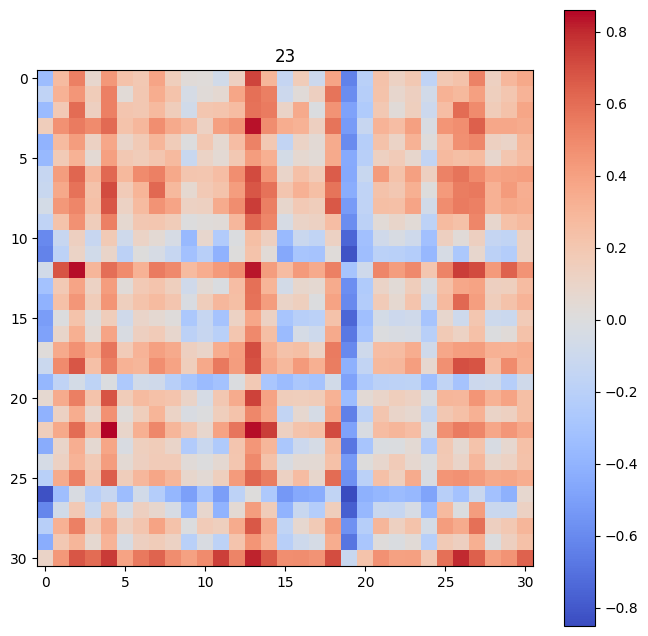

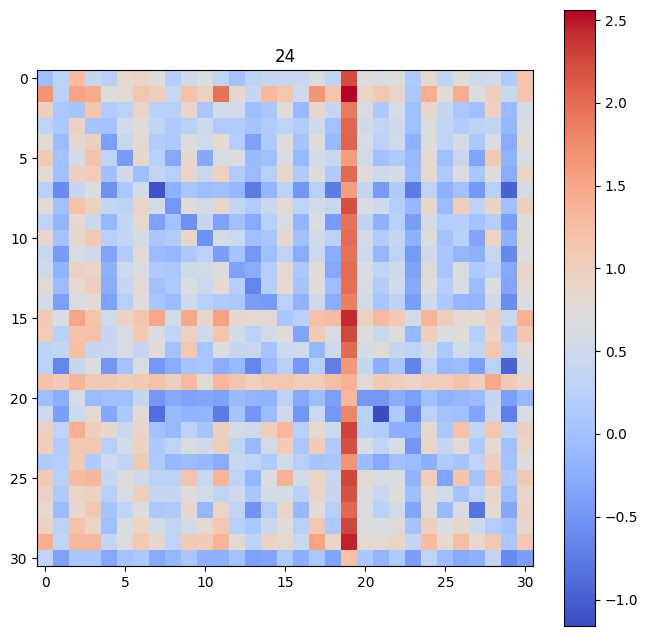

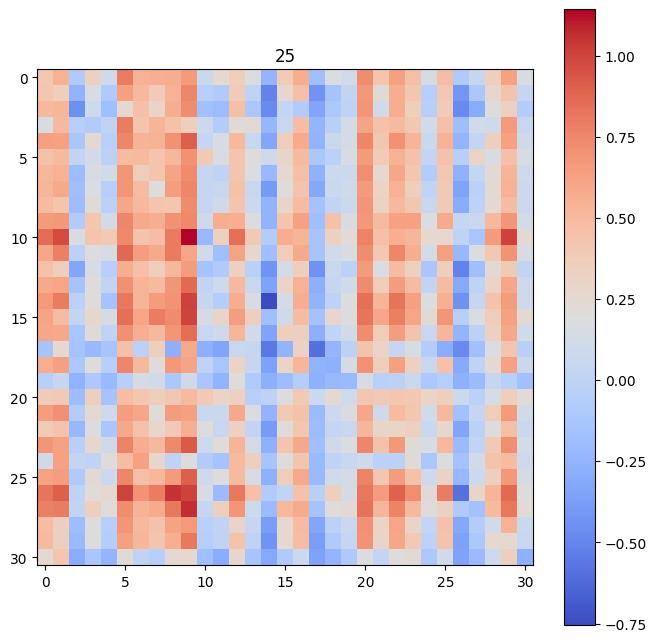

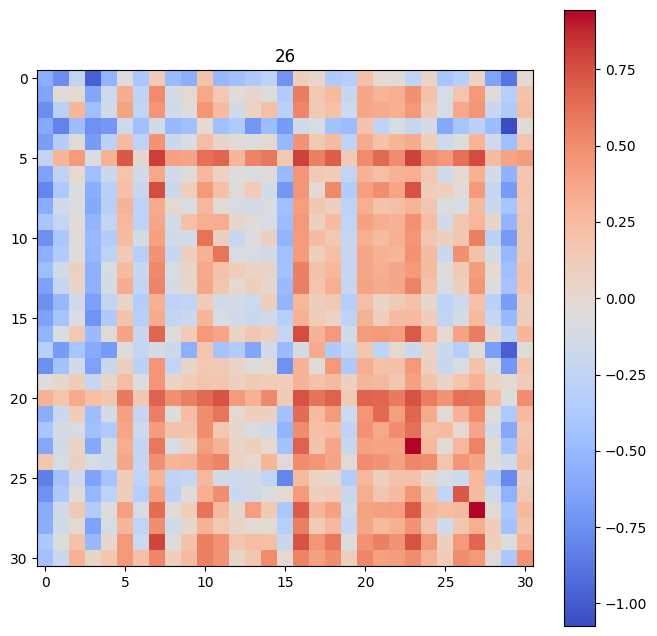

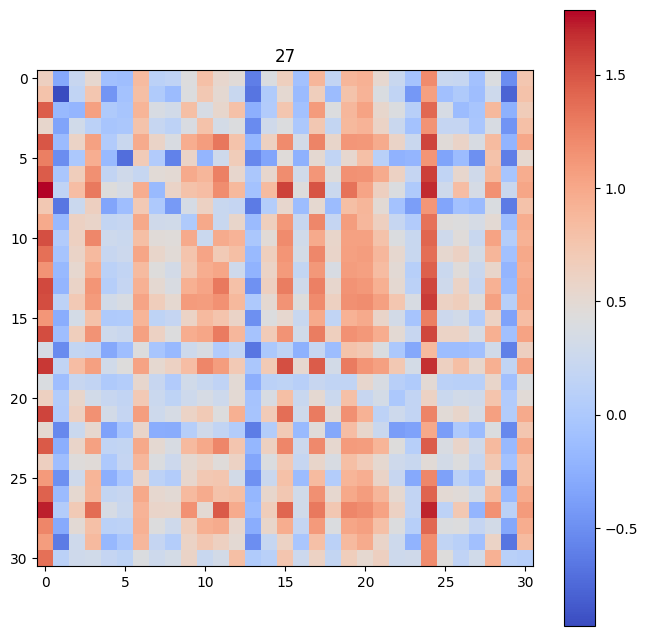

In [120]:
for i in range(28):
    plot_heatmap(reshaped_attn_out_0[0,:,:,-2,i],i)

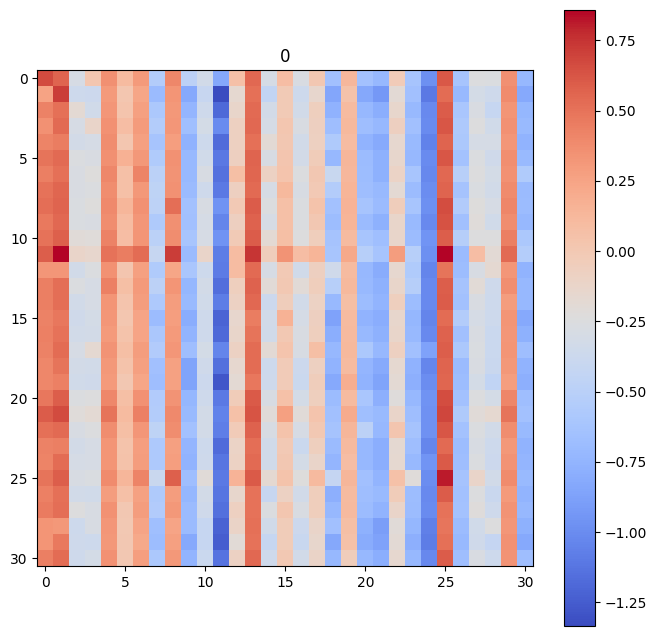

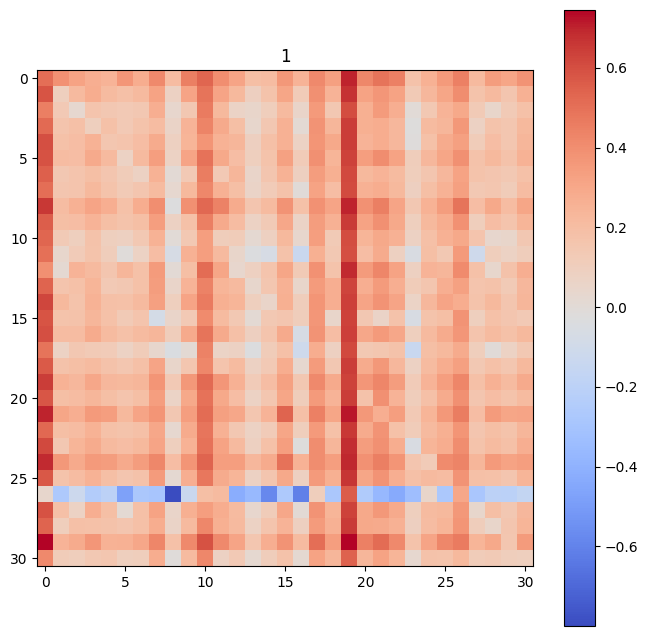

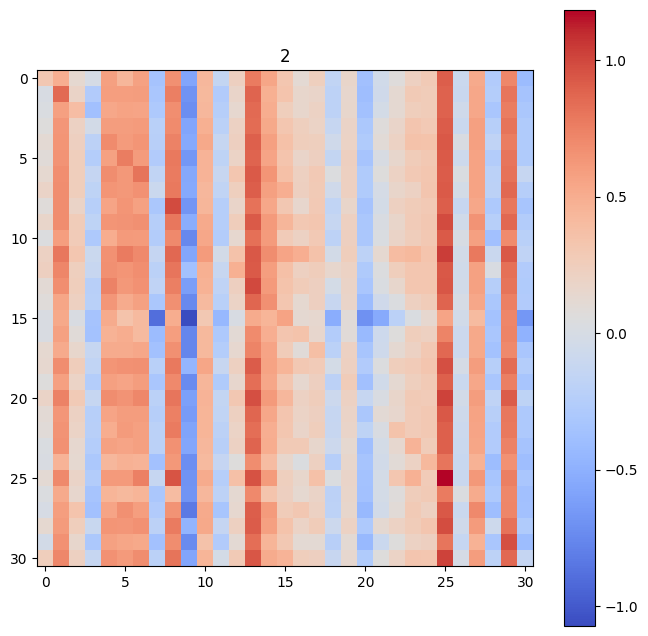

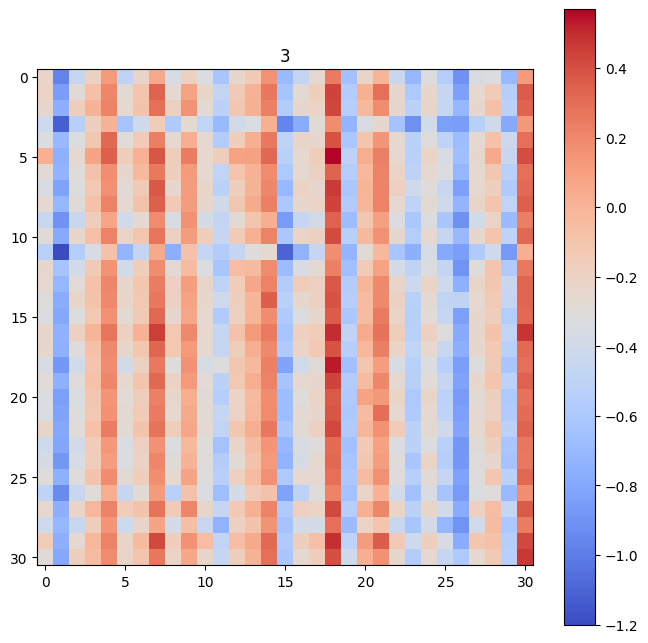

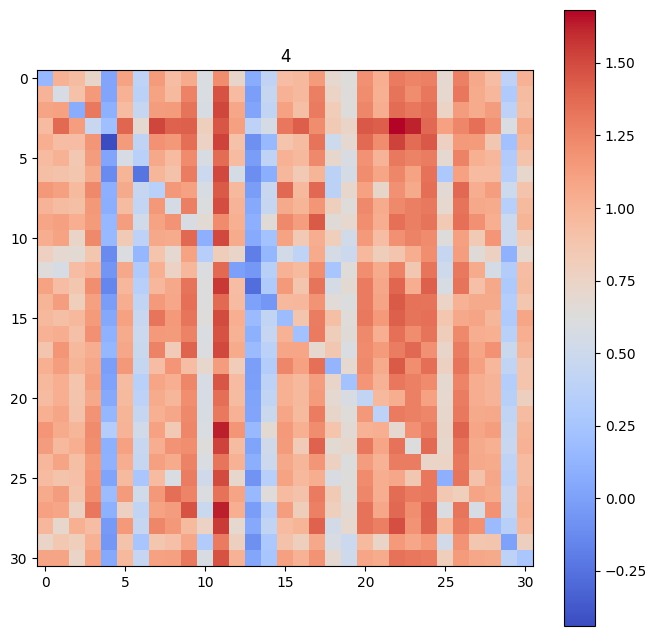

...

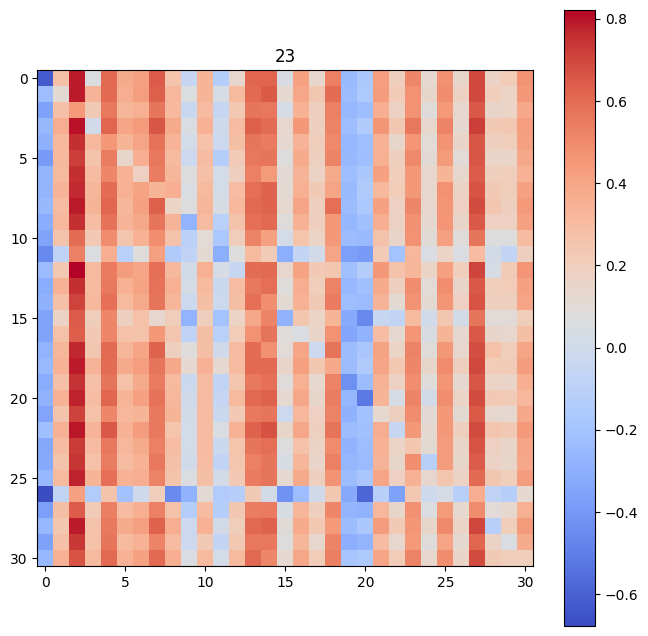

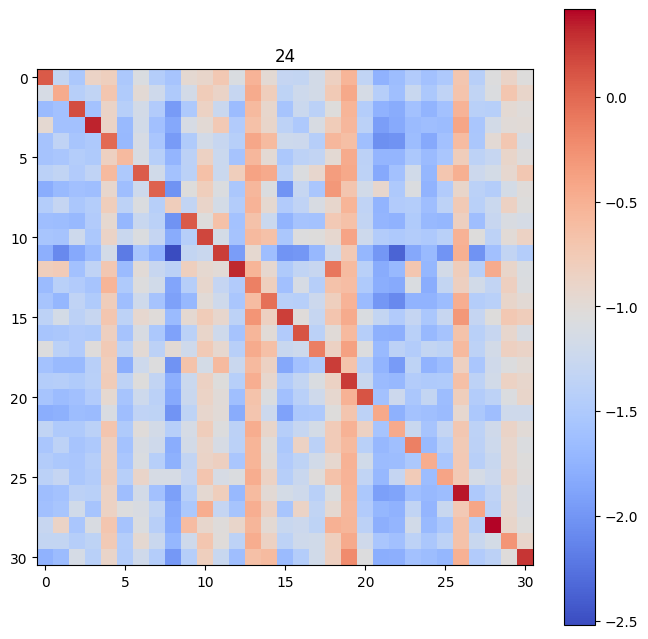

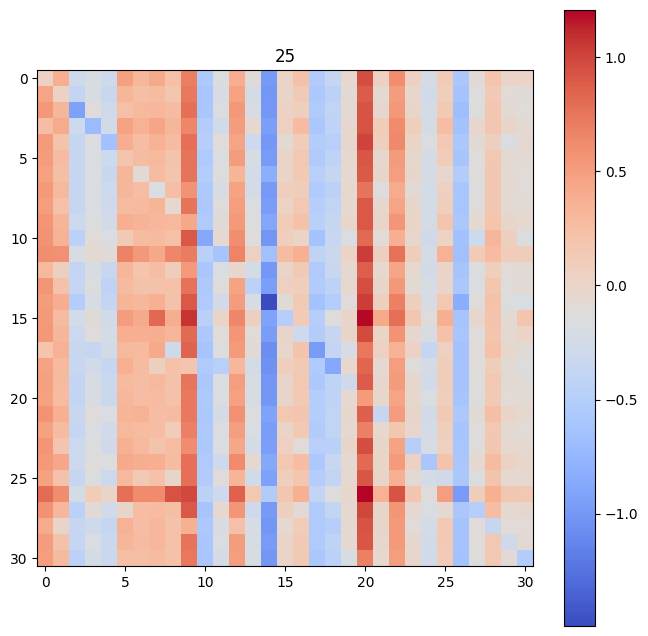

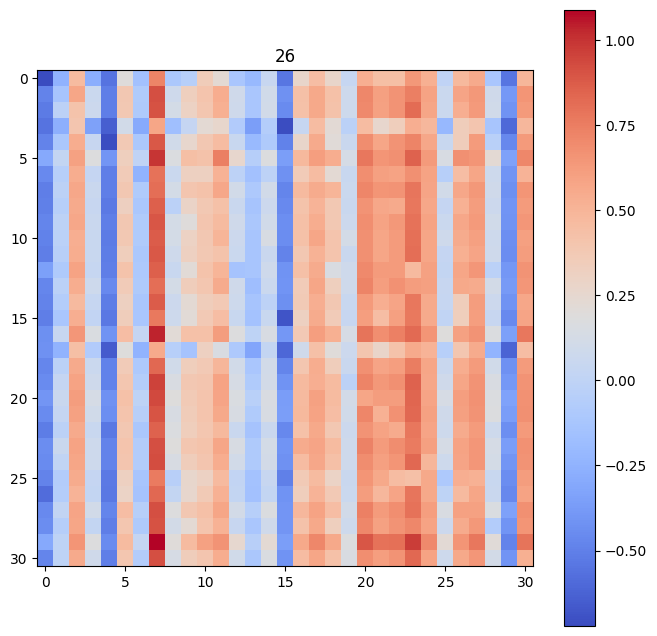

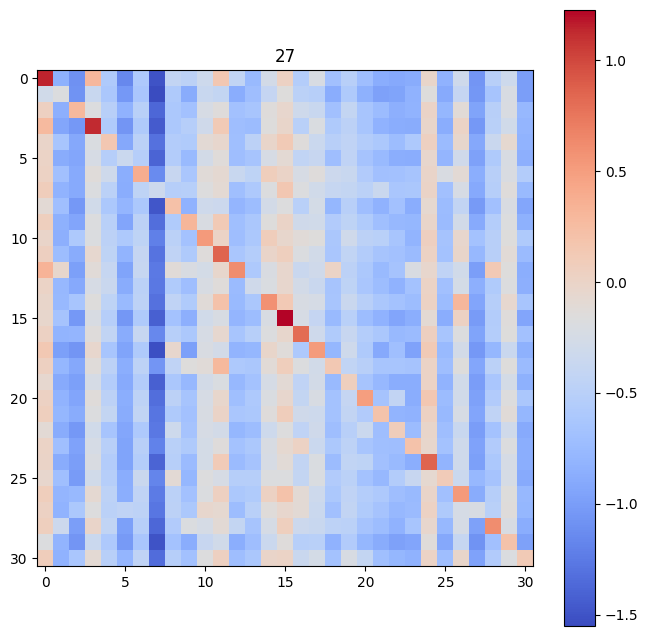

In [122]:
for i in range(28):
    plot_heatmap(reshaped_attn_out_0[1,:,:,-11,i],i)

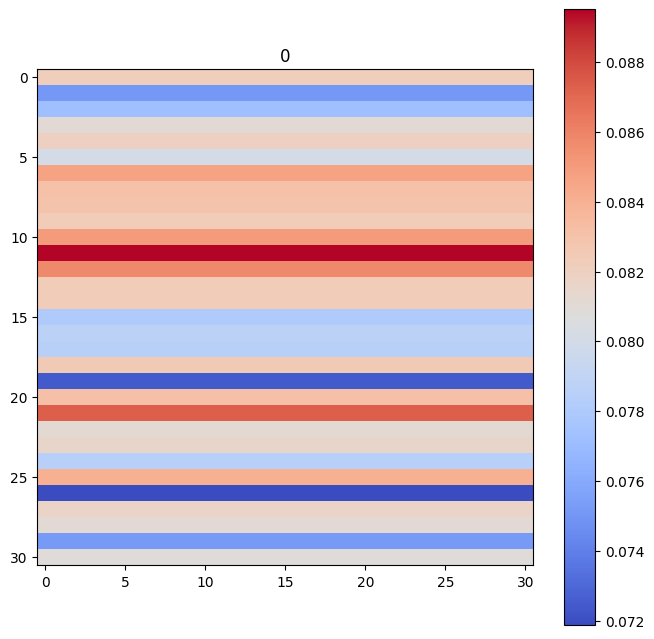

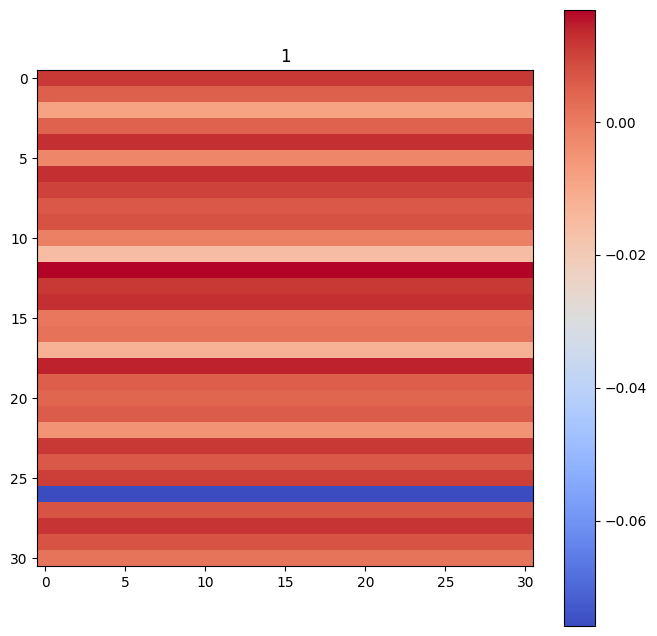

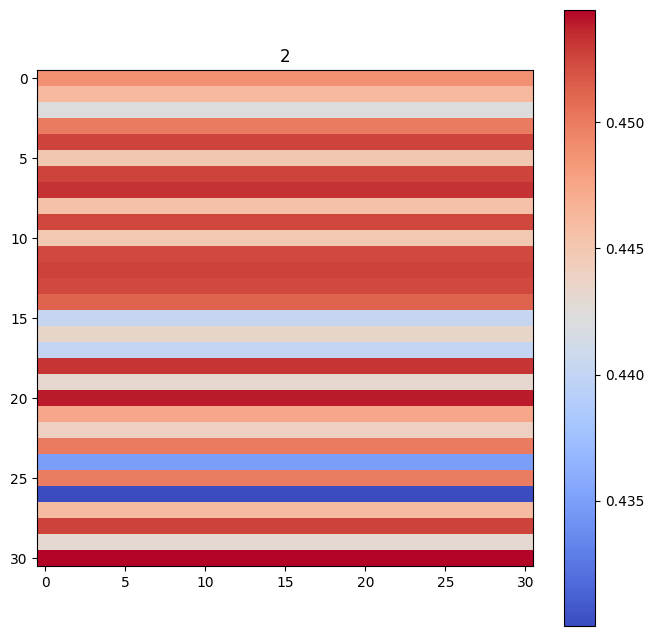

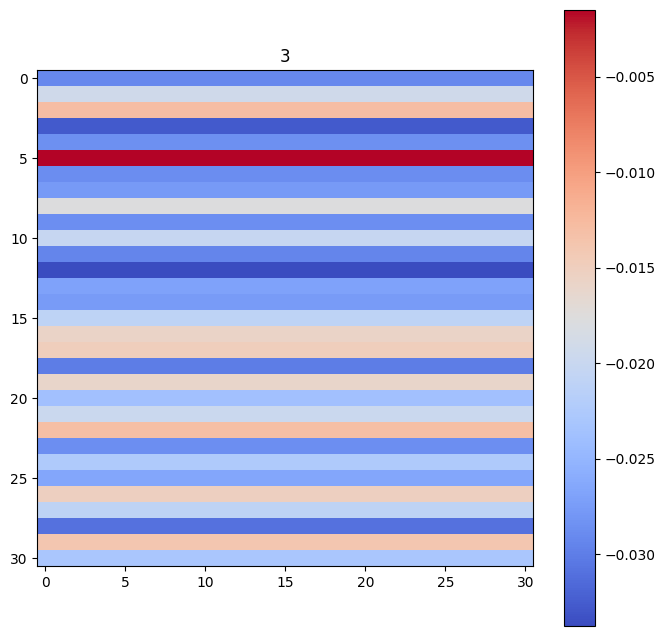

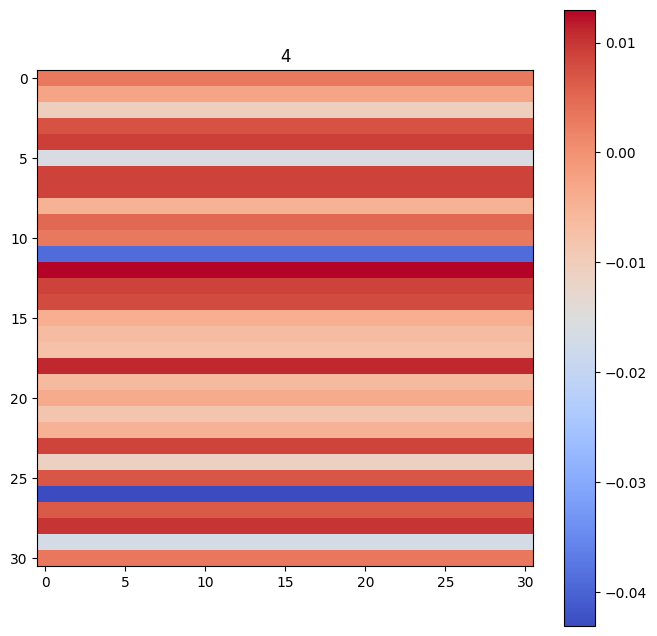

...

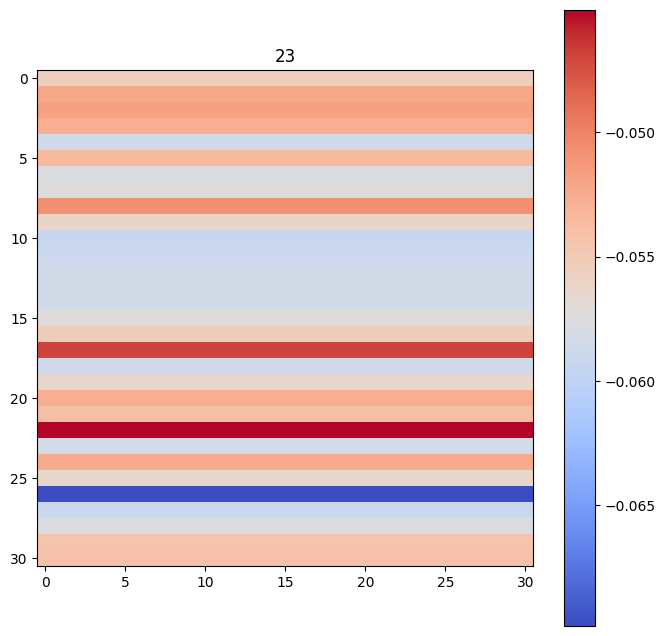

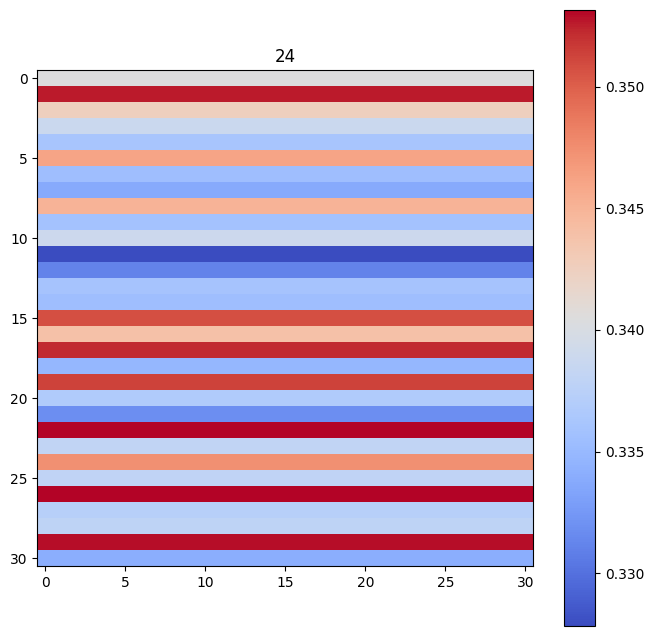

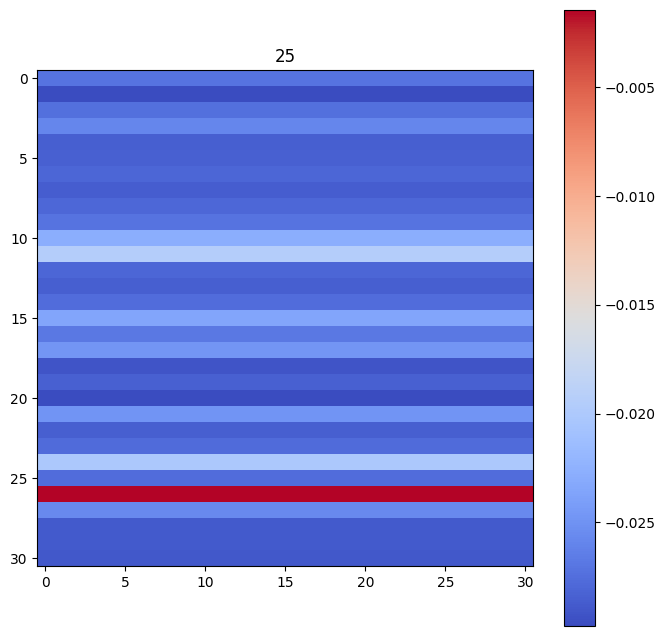

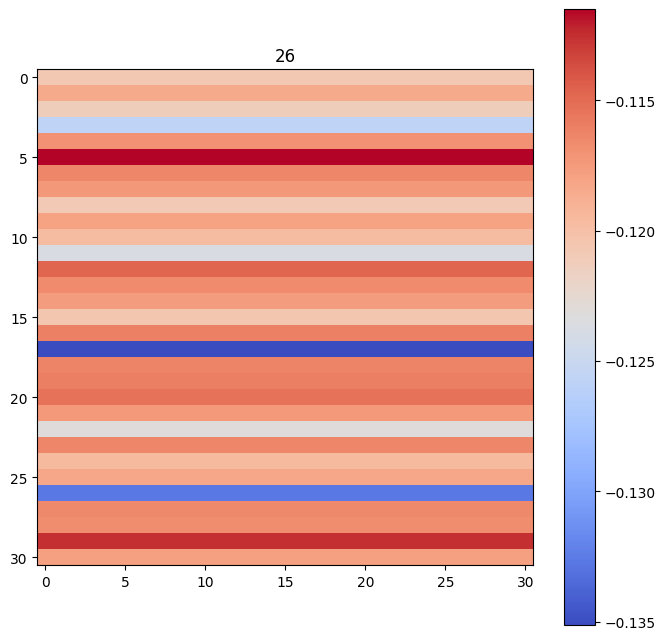

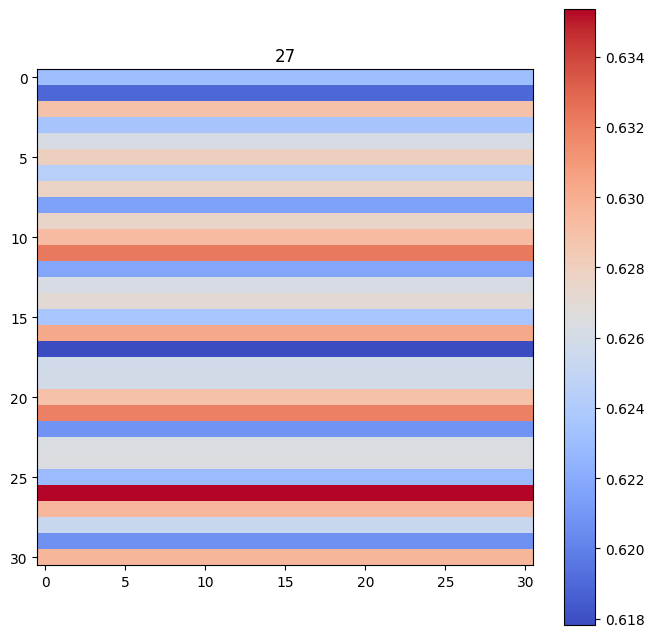

In [162]:
for i in range(28):
    plot_heatmap(reshaped_attn_out_0[0,:,:,-11,i],i)

In [127]:
print(activations['blocks.0.hook_resid_post'].shape)
reshaped_resid_after0 = activations['blocks.0.hook_resid_post'].reshape(2,31,31,22,28)
print(reshaped_resid_after0.shape)

torch.Size([1922, 22, 28])
torch.Size([2, 31, 31, 22, 28])


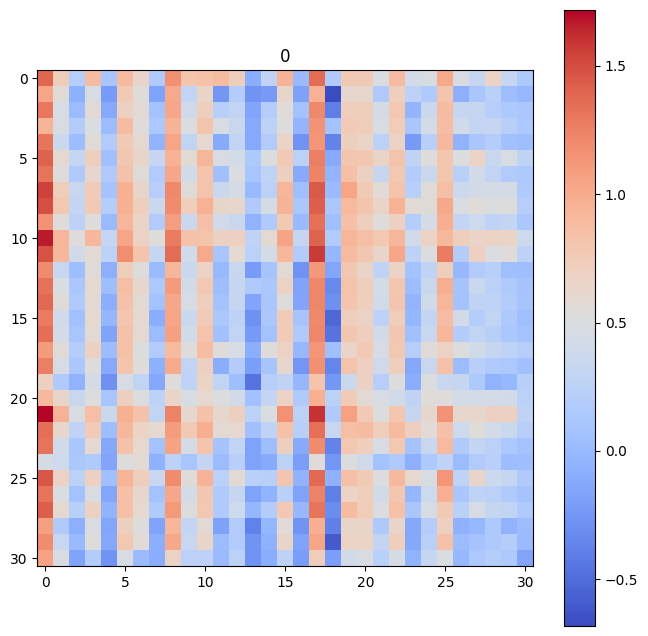

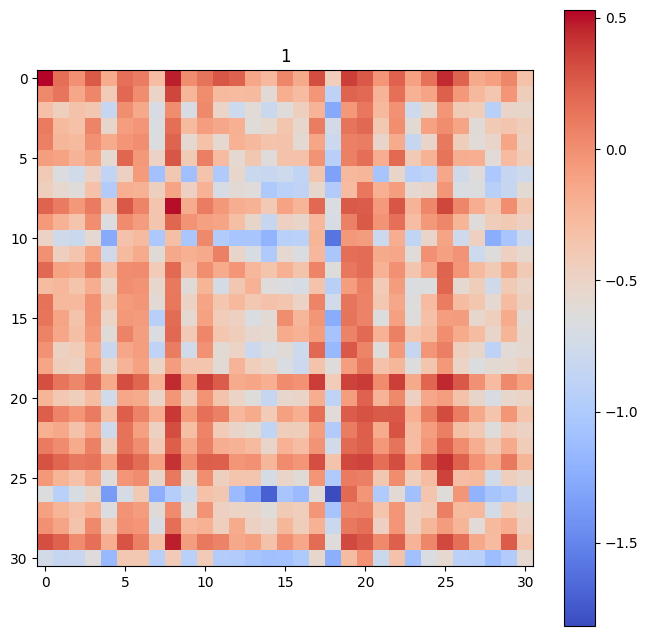

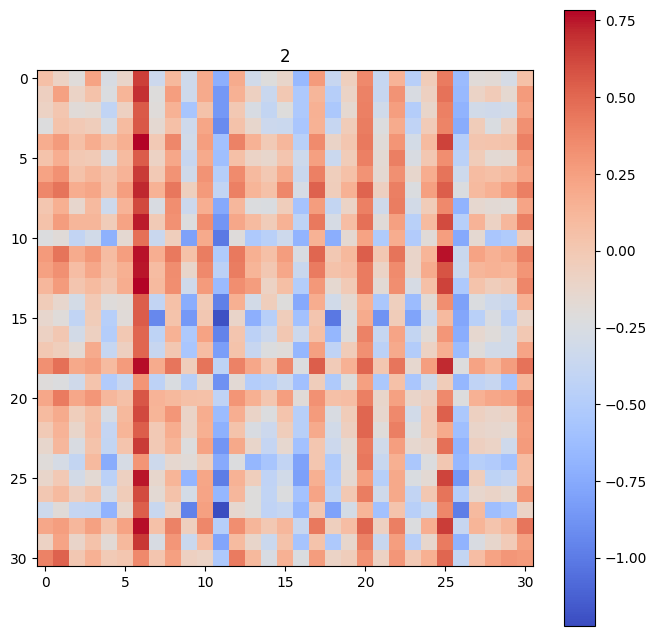

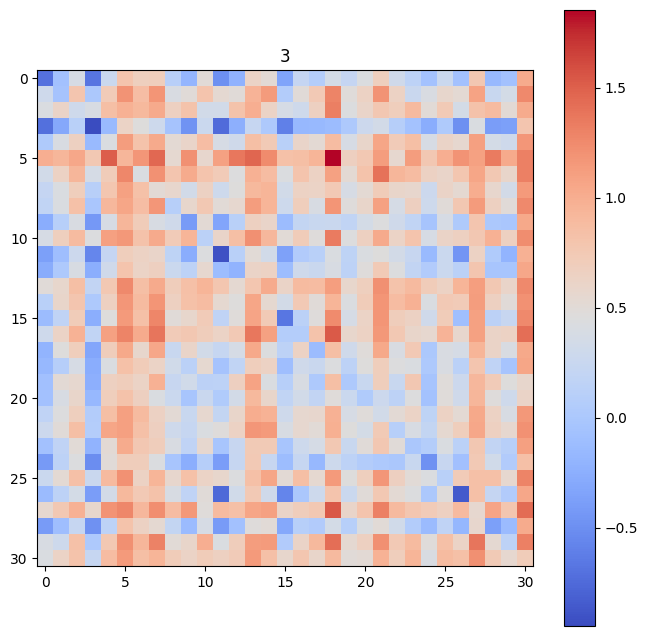

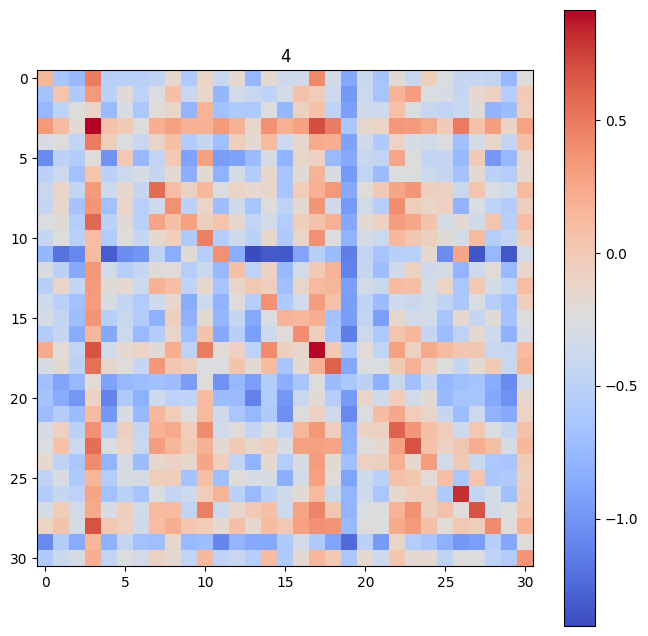

...

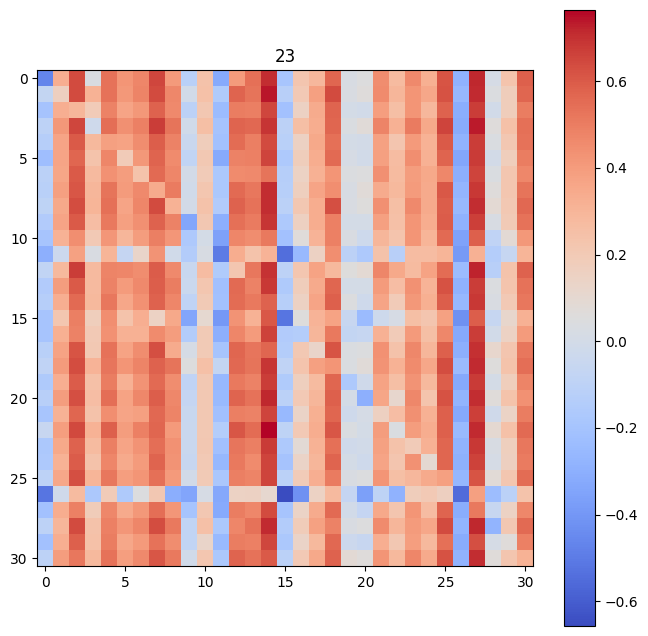

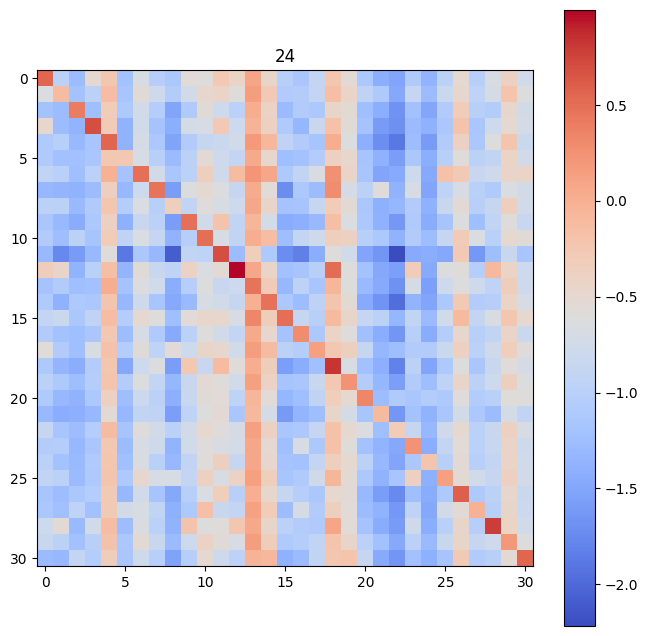

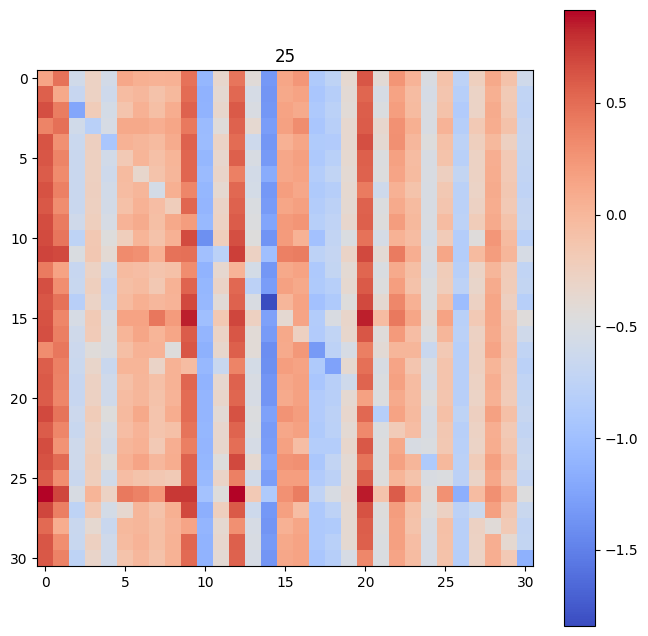

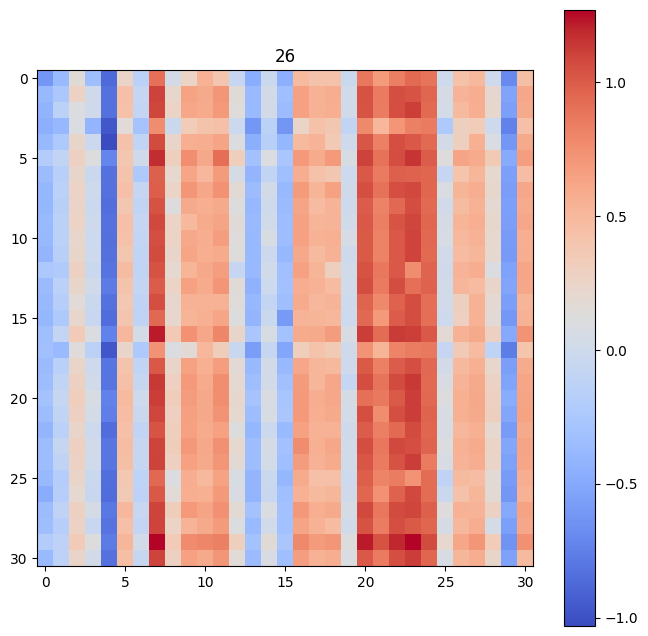

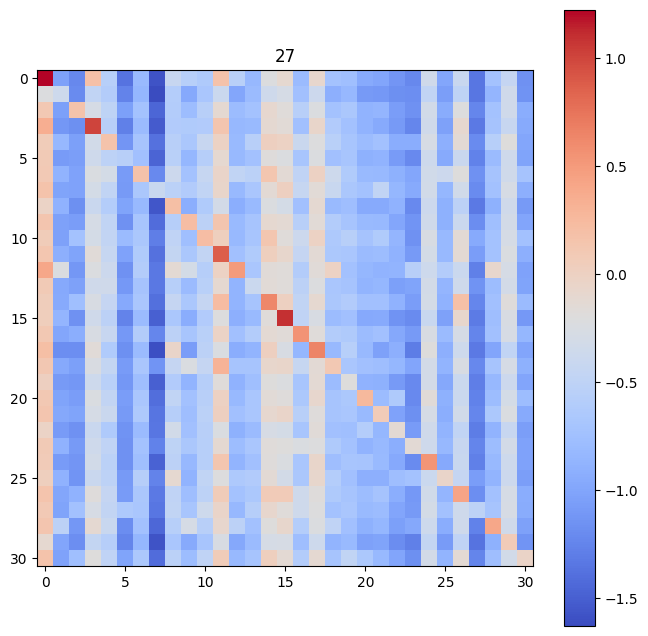

In [128]:
for i in range(28):
    plot_heatmap(reshaped_resid_after0[0,:,:,-2,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_resid_after0[0,:,:,-11,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_resid_after0[1,:,:,-2,i],i)
    
for i in range(28):
    plot_heatmap(reshaped_resid_after0[1,:,:,-11,i],i)

In [136]:
# I was surprised that no diagonal patterns jumped out to me from V1
print(activations['blocks.1.attn.hook_v'].shape)
reshaped_V1 = activations['blocks.1.attn.hook_v'].reshape(2,31,31,22, 2,14)
print(reshaped_V1.shape)

torch.Size([1922, 22, 2, 14])
torch.Size([2, 31, 31, 22, 2, 14])


In [140]:
# 22 is length of seg, only care about -1.
# dataset, X, Y, output pos, head, embedding
reshaped_V1[0,:,:,-1,0,:]


tensor([[[ 0.1074,  0.0640, -1.0053,  ..., -0.3373,  0.0141, -0.8202],
         [ 0.0943,  0.0791, -1.0321,  ..., -0.3378, -0.0036, -0.8136],
         [ 0.0600,  0.1041, -1.0838,  ..., -0.3230, -0.0221, -0.8007],
         ...,
         [ 0.1081,  0.0672, -1.0115,  ..., -0.3620,  0.0045, -0.8409],
         [ 0.0966,  0.0794, -1.0215,  ..., -0.3383, -0.0018, -0.7989],
         [ 0.0875,  0.0684, -1.0723,  ..., -0.3679, -0.0096, -0.8213]],

        [[ 0.0764,  0.0904, -1.0451,  ..., -0.3375, -0.0227, -0.8200],
         [ 0.0630,  0.1056, -1.0706,  ..., -0.3374, -0.0405, -0.8120],
         [ 0.0290,  0.1304, -1.1226,  ..., -0.3227, -0.0587, -0.7994],
         ...,
         [ 0.0772,  0.0936, -1.0507,  ..., -0.3622, -0.0322, -0.8404],
         [ 0.0654,  0.1059, -1.0606,  ..., -0.3382, -0.0387, -0.7977],
         [ 0.0565,  0.0947, -1.1119,  ..., -0.3682, -0.0464, -0.8207]],

        [[-0.0166,  0.1403, -1.1074,  ..., -0.3233, -0.0823, -0.8452],
         [-0.0301,  0.1554, -1.1330,  ..., -0

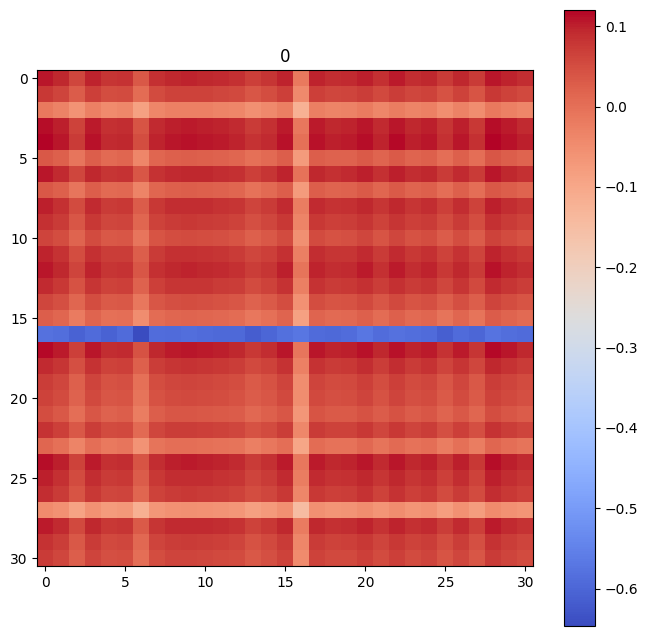

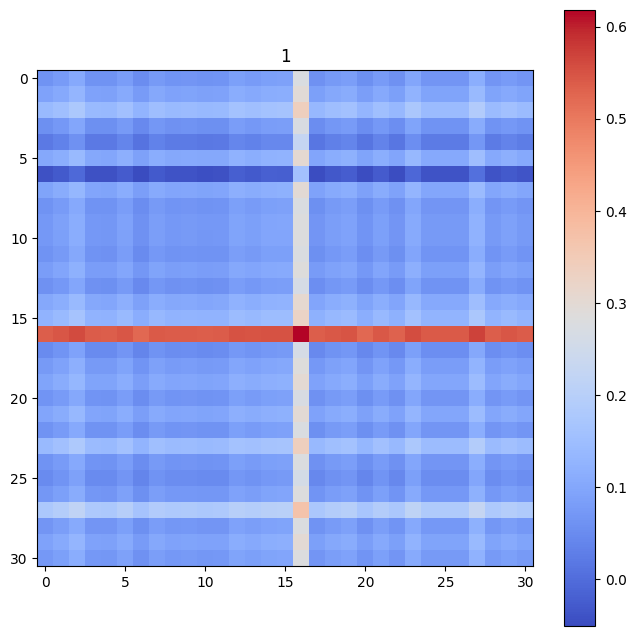

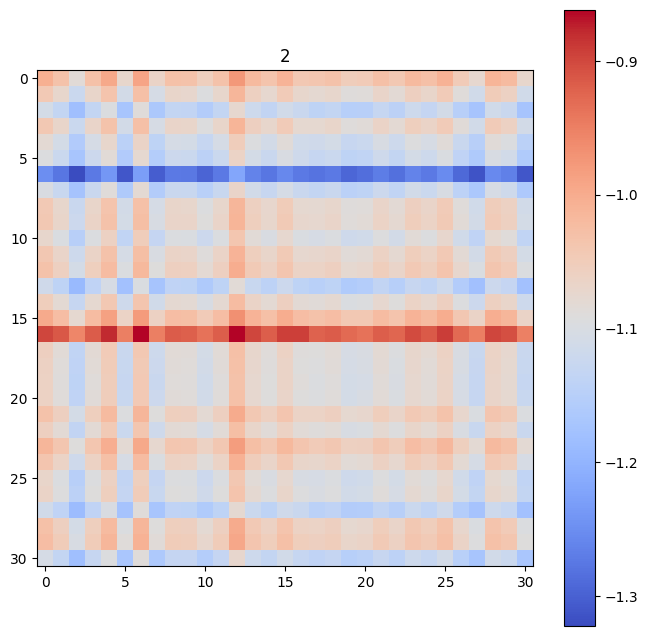

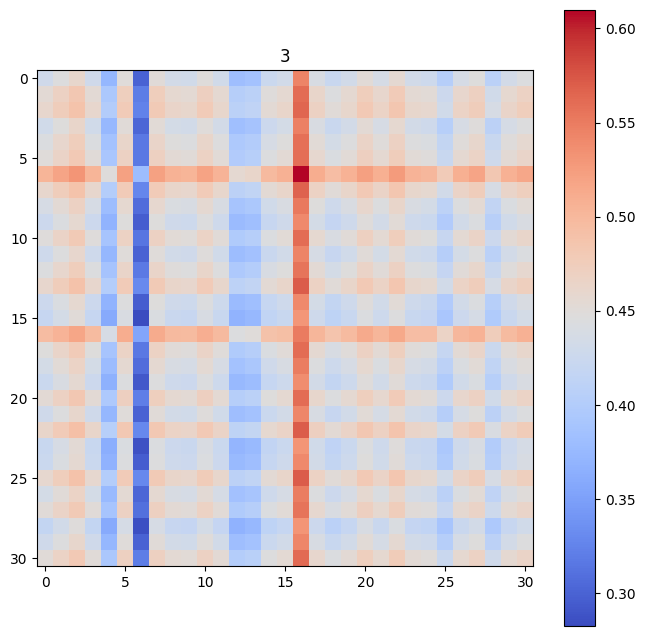

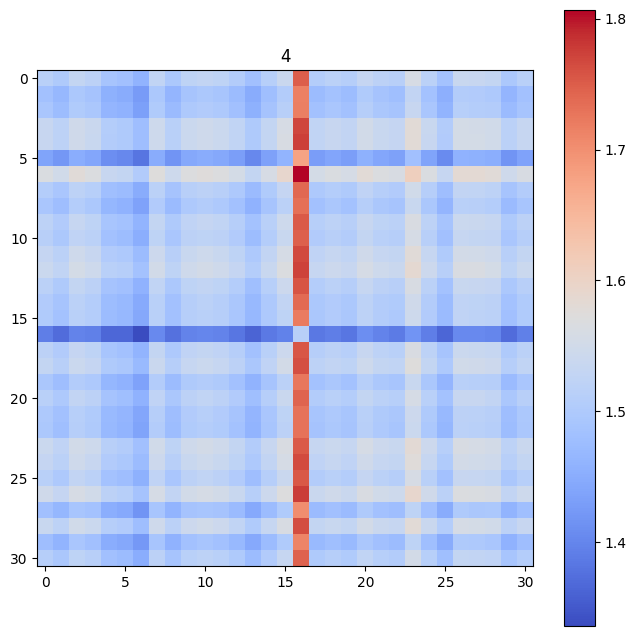

...

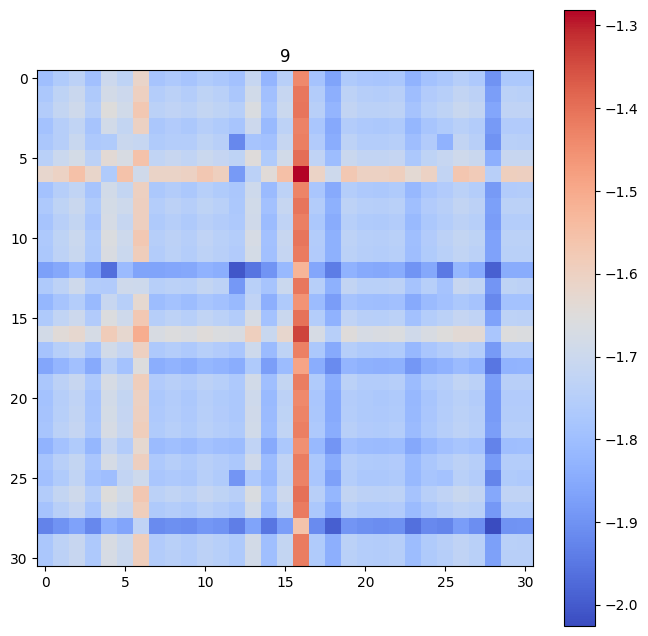

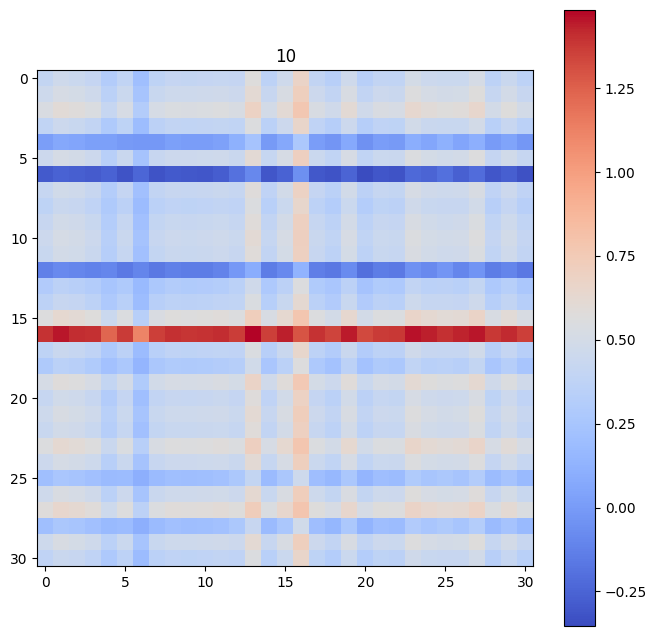

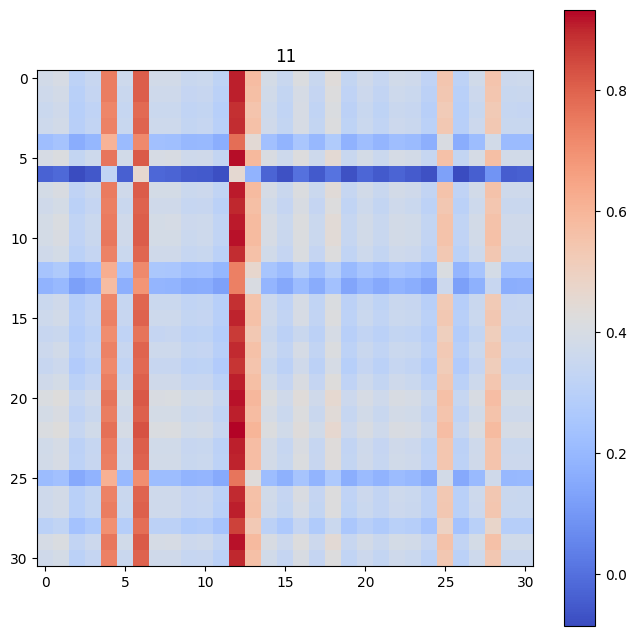

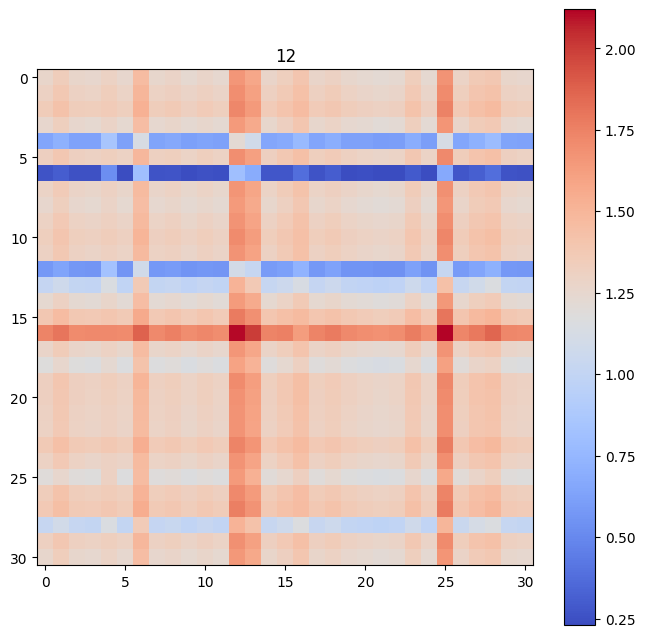

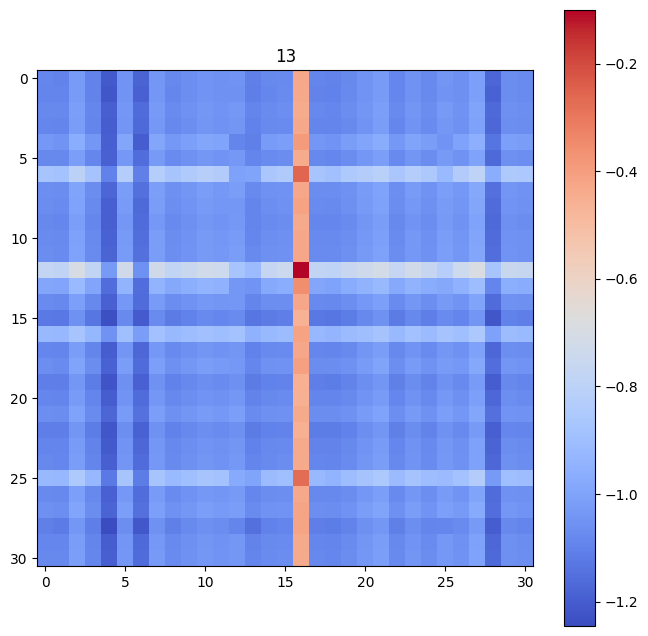

In [142]:
for i in range(14):
    plot_heatmap(reshaped_V1[0,:,:,-1,0,i],i)
    
for i in range(14):
    plot_heatmap(reshaped_V1[0,:,:,-1,0,i],i)
    
for i in range(14):
    plot_heatmap(reshaped_V1[1,:,:,-1,1,i],i)
    
for i in range(14):
    plot_heatmap(reshaped_V1[1,:,:,-1,1,i],i)
    
    

In [133]:
reshaped_attn1[0,:,:,0,-1]

tensor([[[-2.0612e-01, -2.1142e-01, -3.8318e-02,  ..., -3.5099e+00,
          -2.4943e+00,  7.0637e-01],
         [-1.9769e-01, -1.8850e-01, -3.0979e-02,  ..., -3.5207e+00,
          -4.3111e+00,  7.2566e-01],
         [-1.5951e-01, -1.3963e-01, -3.3530e-02,  ..., -3.5398e+00,
          -1.0189e+01,  7.9804e-01],
         ...,
         [-1.9789e-01, -1.8228e-01, -2.5729e-02,  ..., -3.5275e+00,
          -7.0877e+00,  6.8750e-01],
         [-2.1466e-01, -2.1048e-01, -5.3038e-02,  ..., -3.5282e+00,
          -3.4745e+00,  7.1357e-01],
         [-2.0631e-01, -1.7399e-01, -5.9854e-02,  ..., -3.5450e+00,
          -1.0718e+01,  7.2280e-01]],

        [[-2.0473e-01, -5.3808e-03,  5.3946e-01,  ..., -3.4098e+00,
          -1.0069e+01,  6.5628e-01],
         [-1.9576e-01,  1.2055e-02,  5.4412e-01,  ..., -3.4154e+00,
          -1.1981e+00,  6.7348e-01],
         [-1.5749e-01,  2.2236e-02,  5.6596e-01,  ..., -3.4325e+00,
          -1.0134e+01,  7.4665e-01],
         ...,
         [-1.9632e-01,  1

In [154]:
print(activations['blocks.1.attn.hook_attn_scores'].shape)
reshaped_attn1 = activations['blocks.1.attn.hook_attn_scores'].reshape(2,31,31,2, 22,22)
print(reshaped_attn1.shape)

torch.Size([1922, 2, 22, 22])
torch.Size([2, 31, 31, 2, 22, 22])


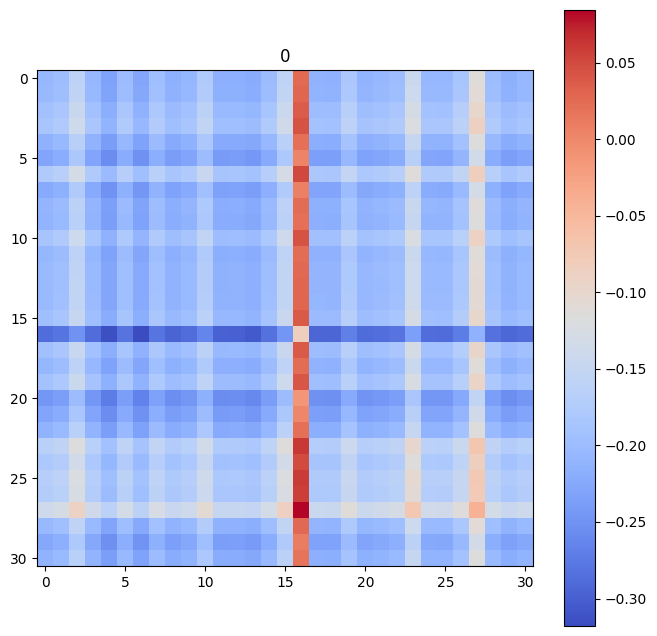

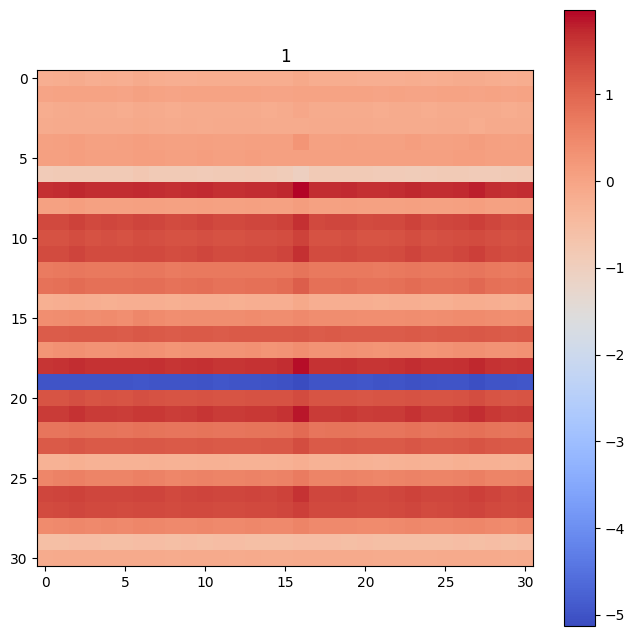

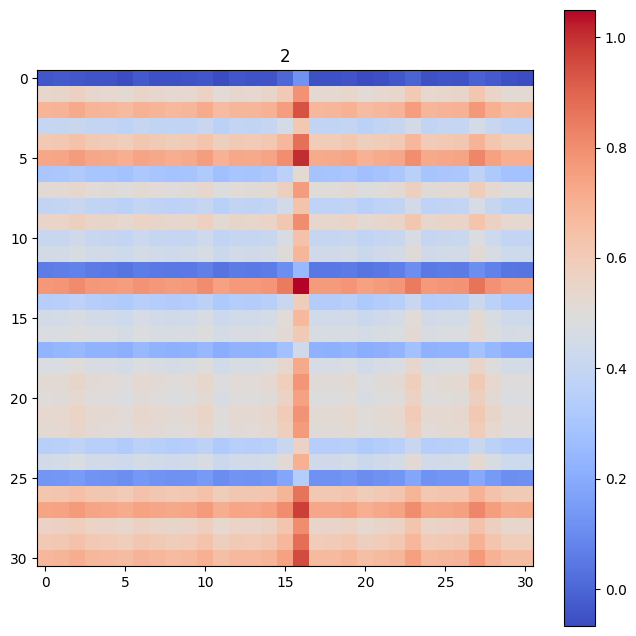

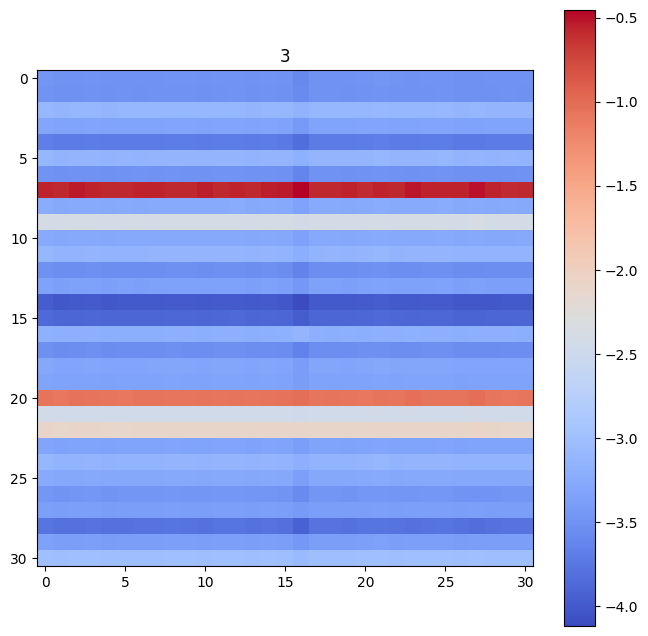

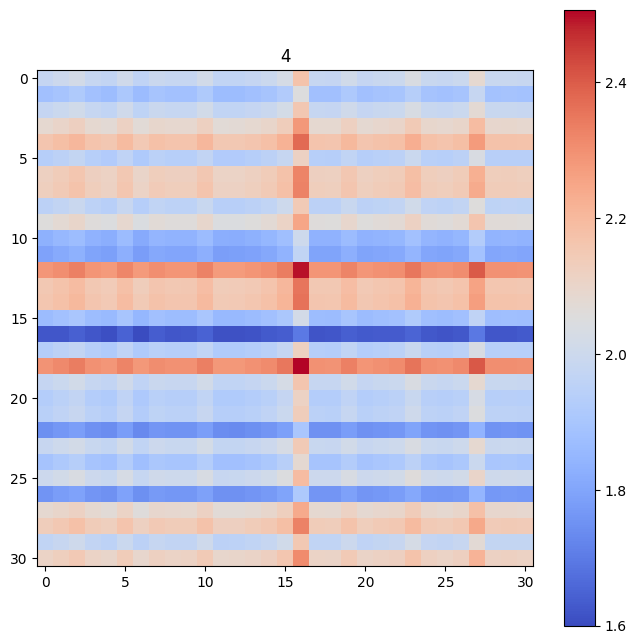

...

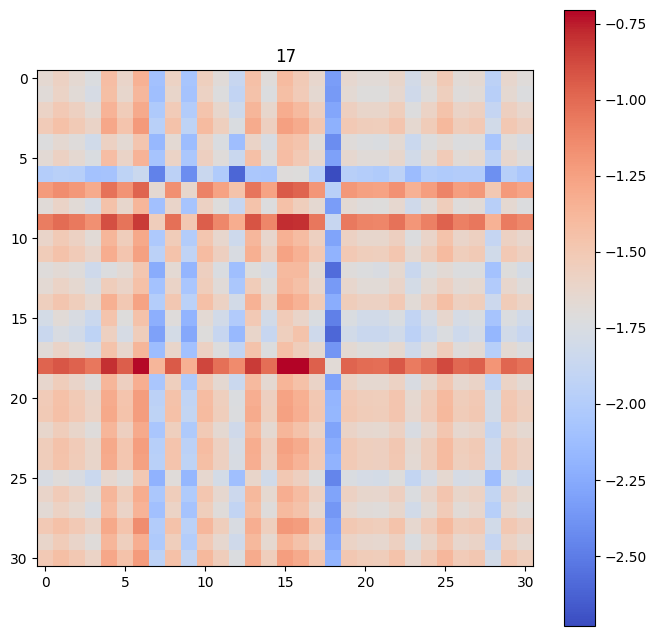

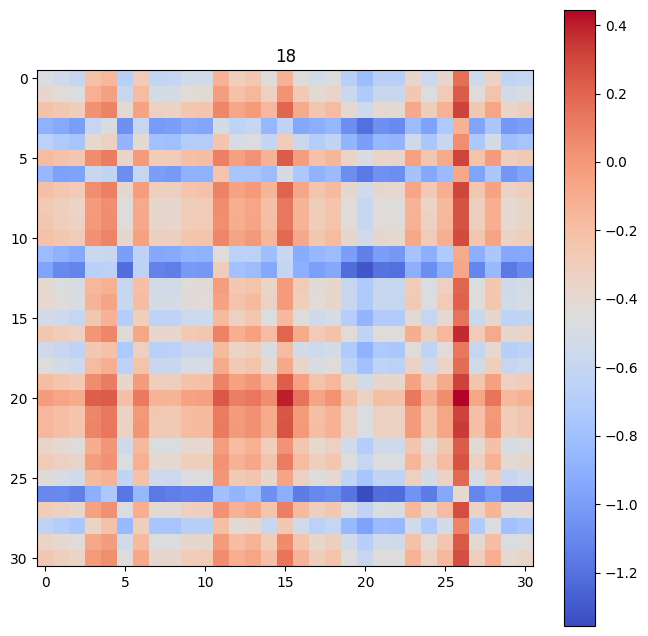

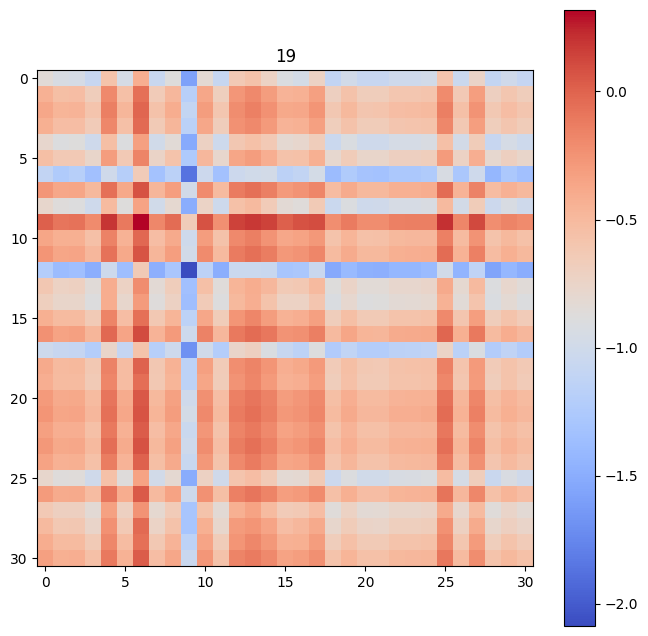

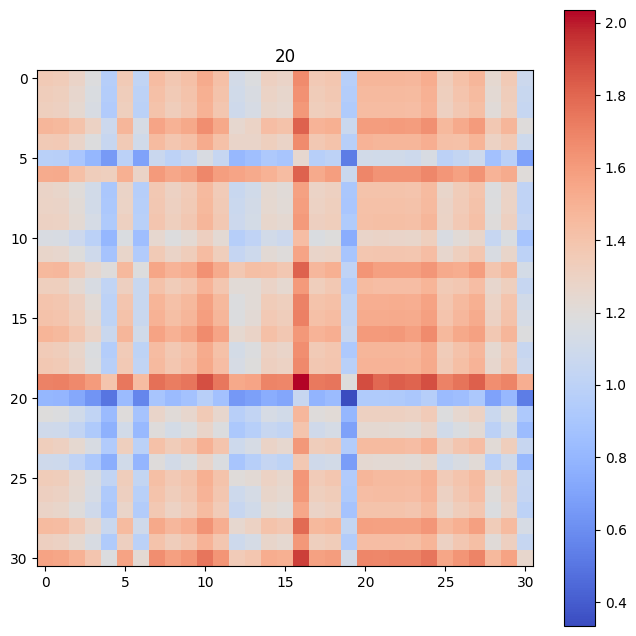

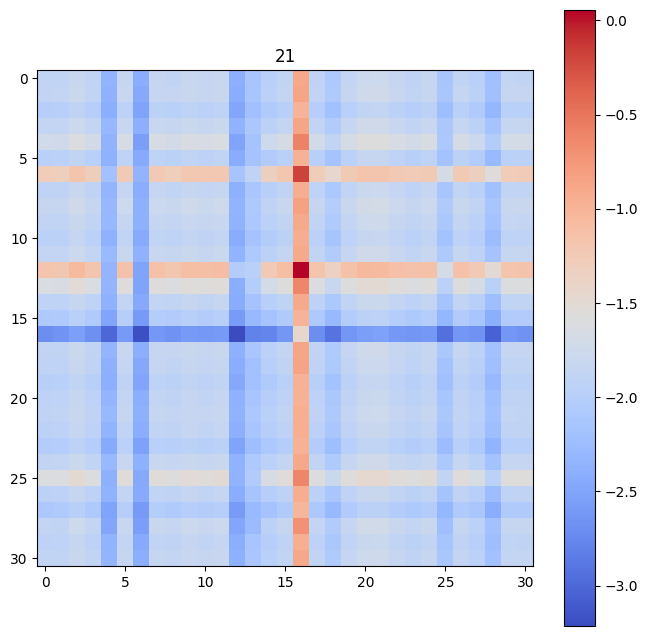

In [155]:
# dataset 0, head 0  - pattern on 20
for i in range(22):
    plot_heatmap(reshaped_attn1[0,:,:,0,-1,i],i)

# dataset 0, head 1 - pattern on 20
for i in range(22):
    plot_heatmap(reshaped_attn1[0,:,:,1,-1,i],i)

# dataset 1, head 0 - pattern on 11
for i in range(22):
    plot_heatmap(reshaped_attn1[1,:,:,0,-1,i],i)

# dataset 1, head 1 - pattern on 11
for i in range(22):
    plot_heatmap(reshaped_attn1[1,:,:,1,-1,i],i)
    


In [156]:
print(activations['blocks.1.hook_attn_out'].shape)
reshaped_attn_out1 = activations['blocks.1.hook_attn_out'].reshape(2,31,31,22,28)
print(reshaped_attn_out1.shape)

torch.Size([1922, 22, 28])
torch.Size([2, 31, 31, 22, 28])


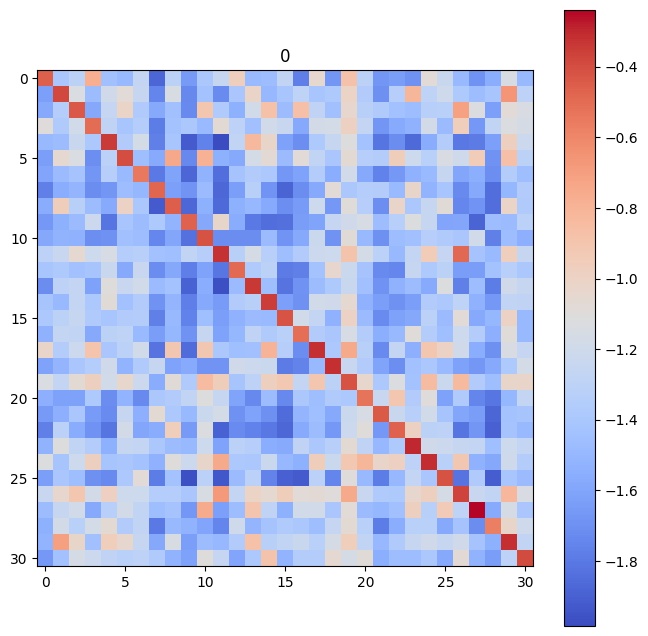

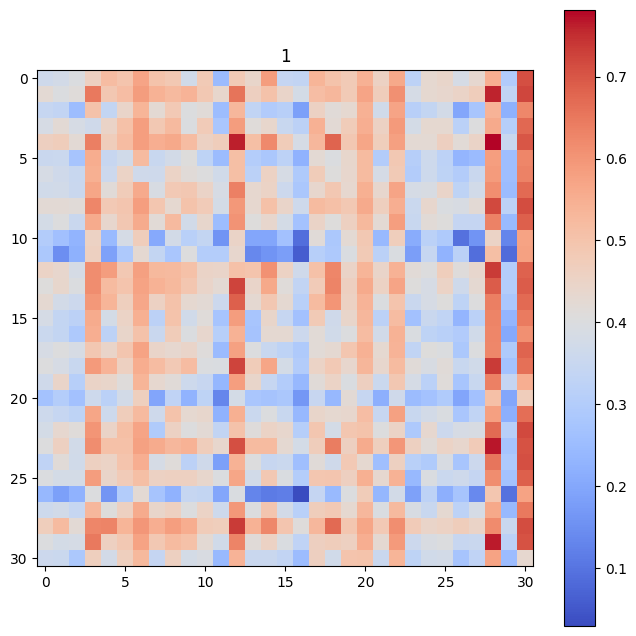

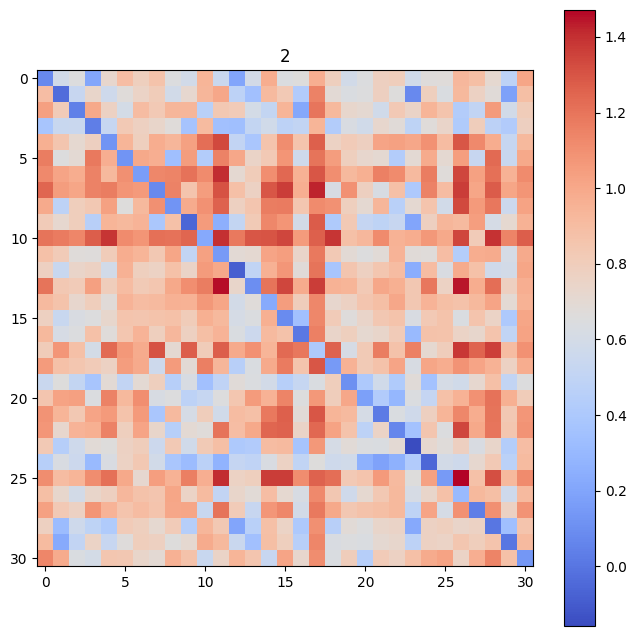

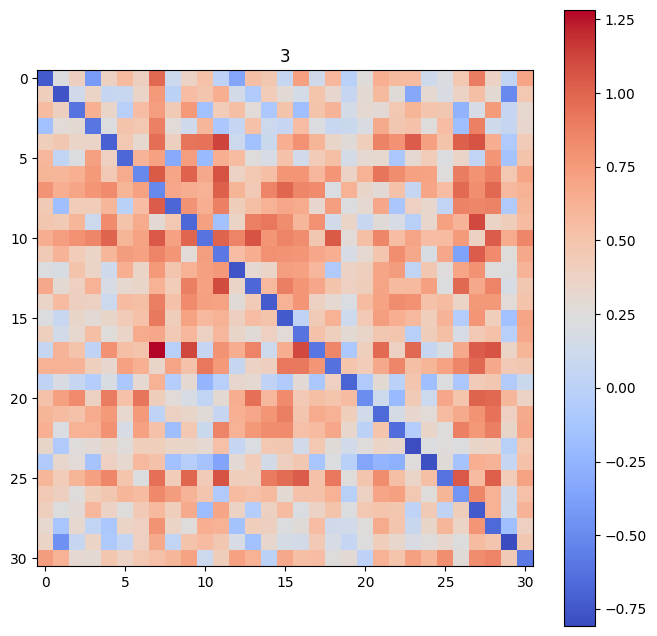

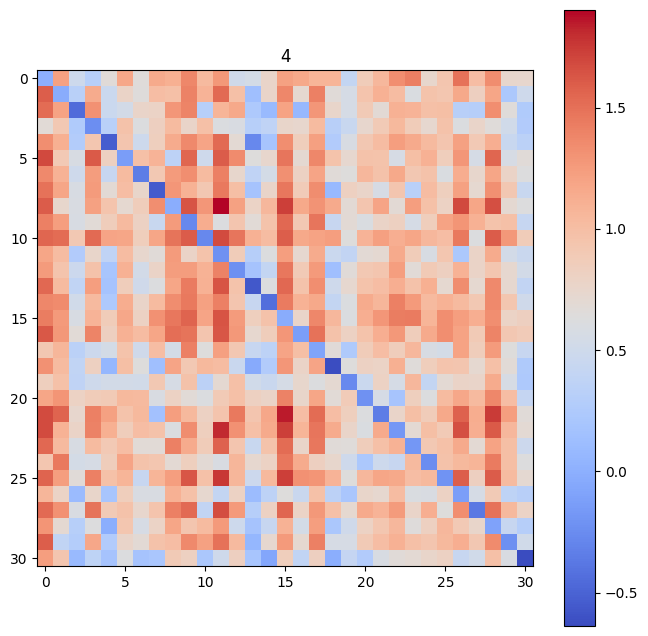

...

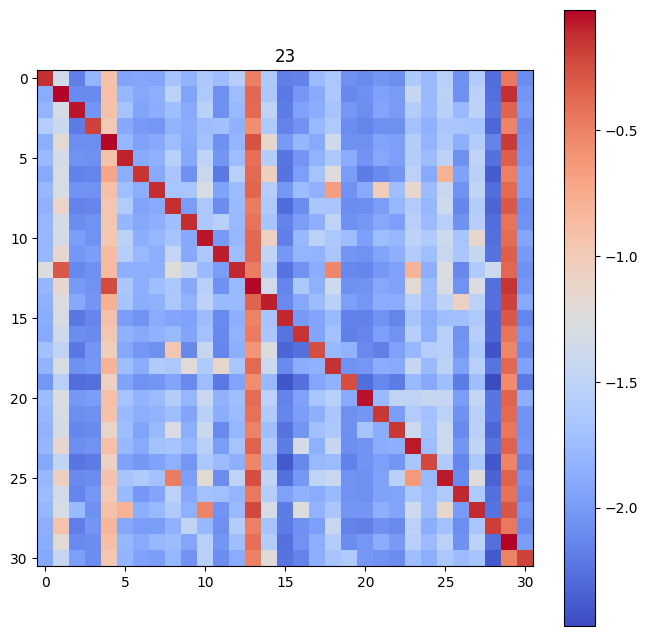

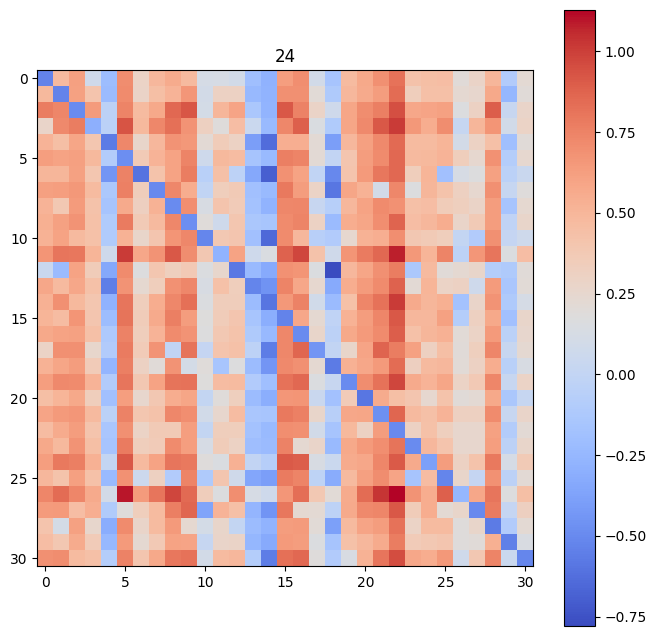

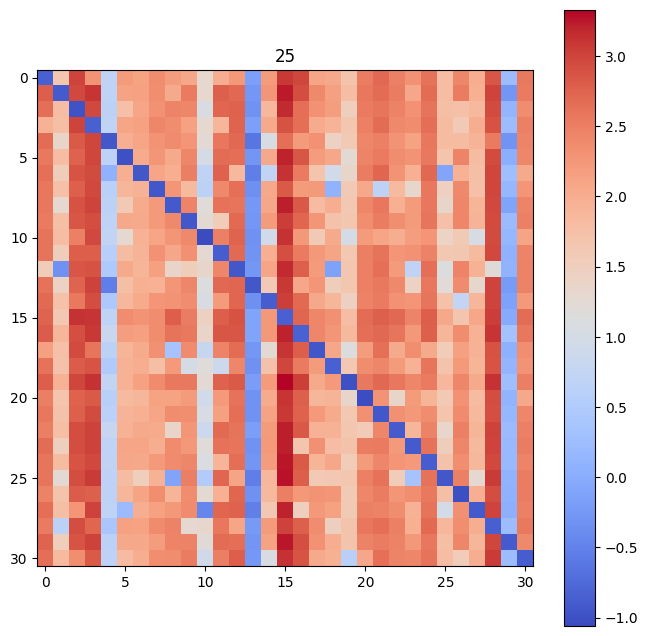

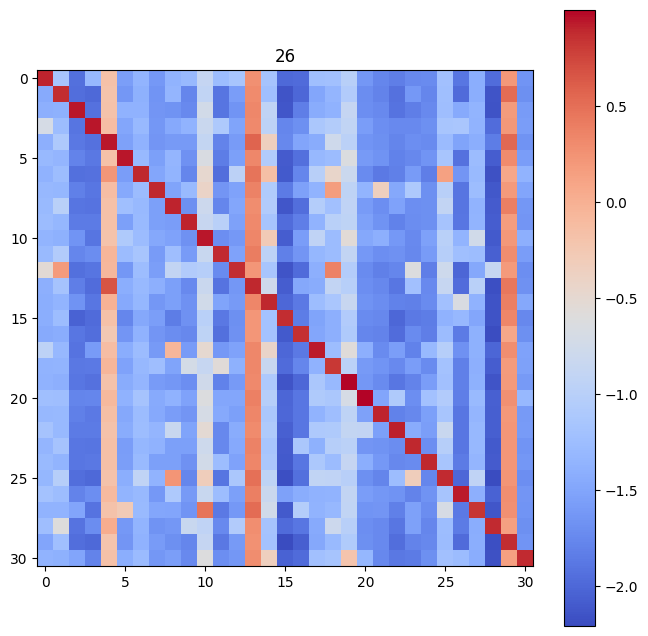

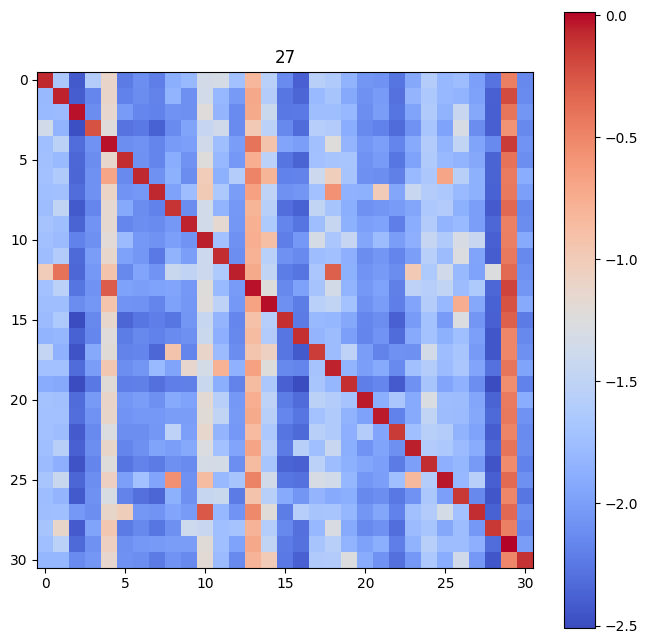

In [159]:
# dataset 0 - pattern on all but 1
for i in range(28):
    plot_heatmap(reshaped_attn_out1[0,:,:,-1,i],i)

# dataset 1 - pattern on all but 1
for i in range(28):
    plot_heatmap(reshaped_attn_out1[1,:,:,-1,i],i)


In [160]:
print(activations['blocks.1.hook_resid_post'].shape)
resid_post_1 = activations['blocks.1.hook_resid_post'].reshape(2,31,31,22,28)
print(resid_post_1.shape)

torch.Size([1922, 22, 28])
torch.Size([2, 31, 31, 22, 28])


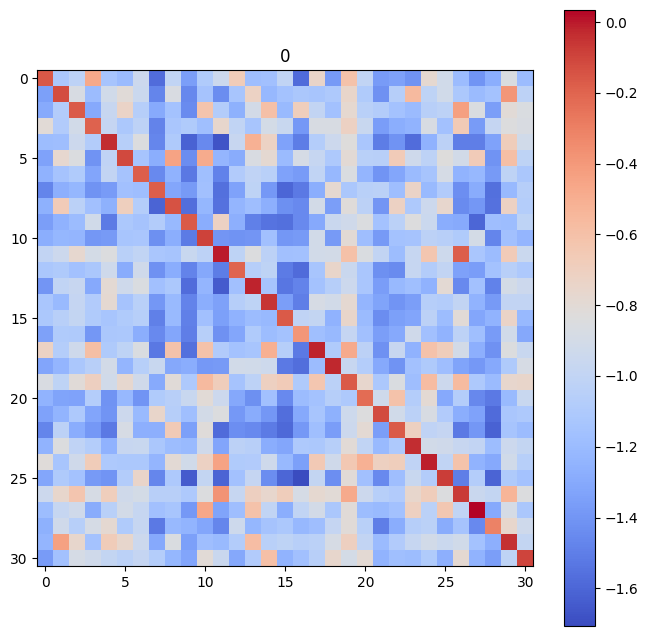

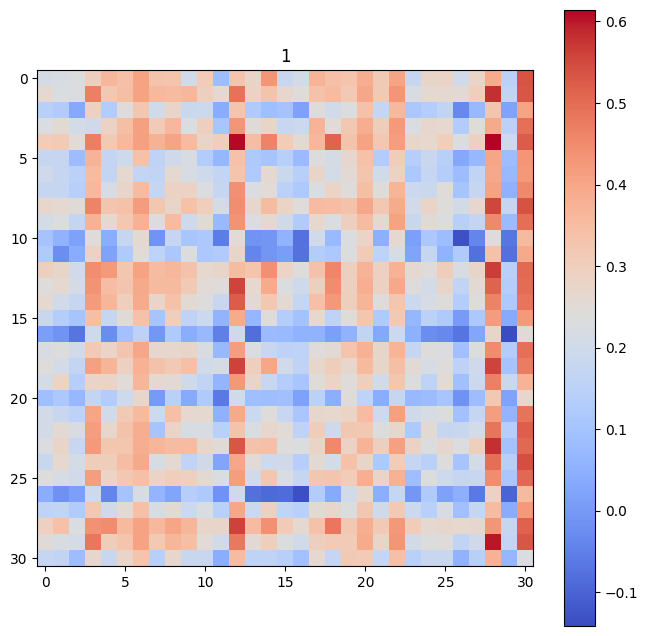

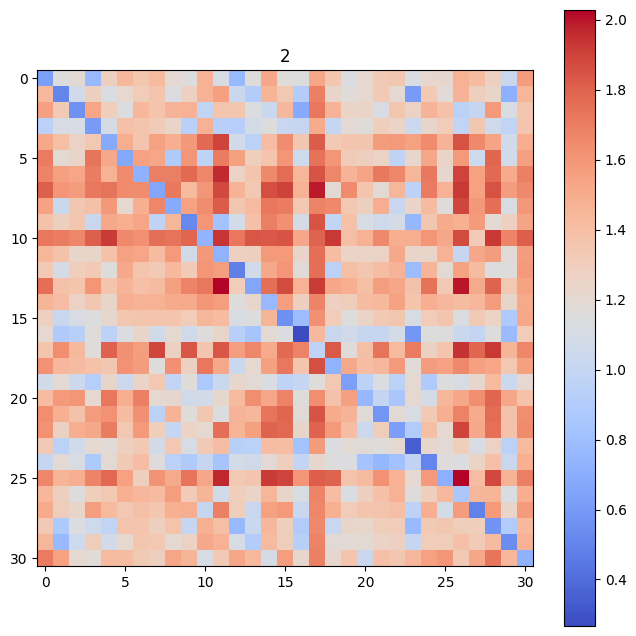

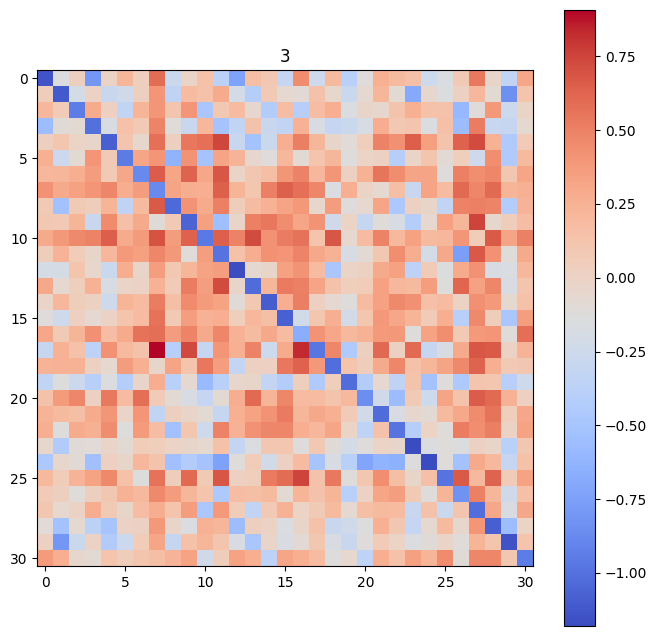

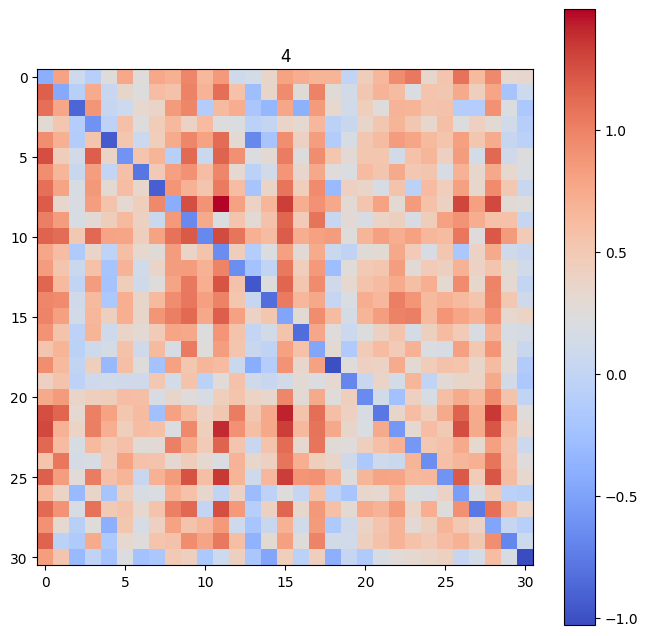

...

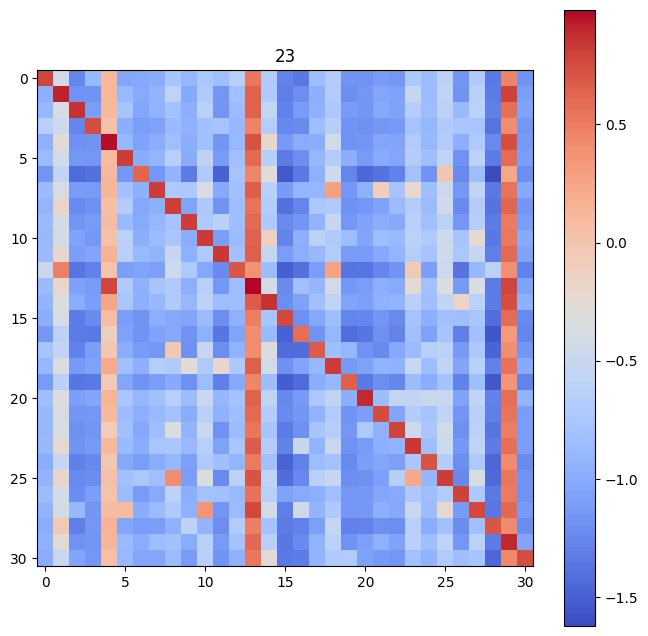

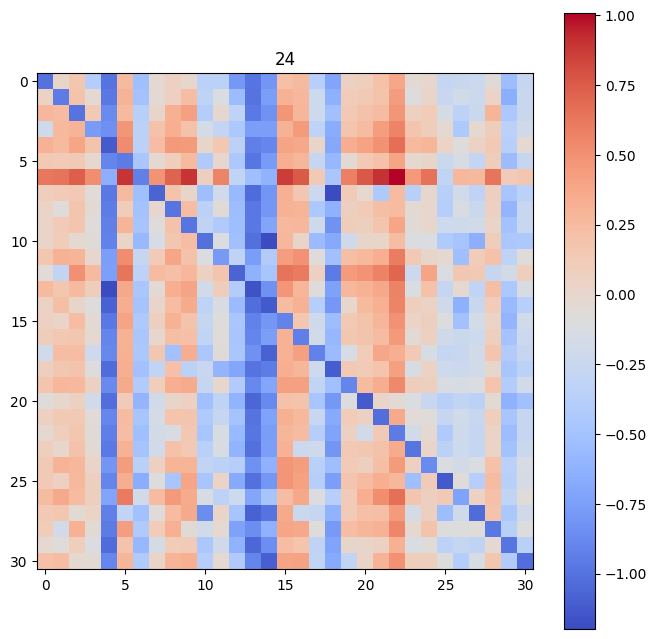

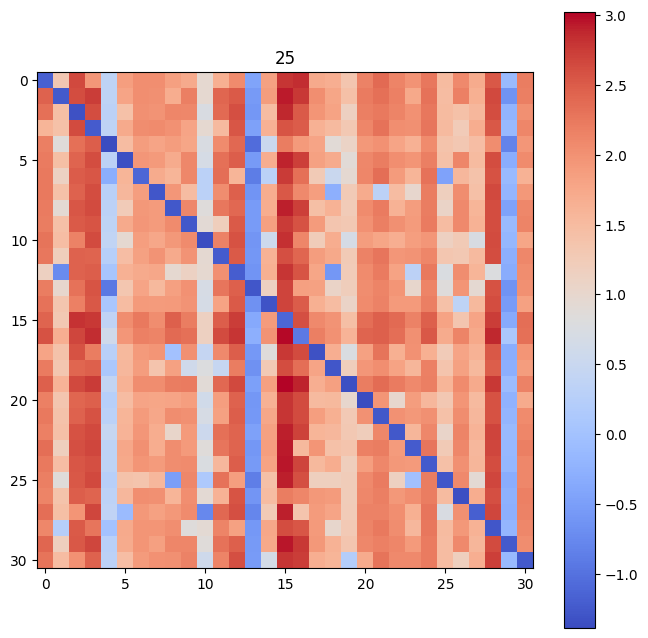

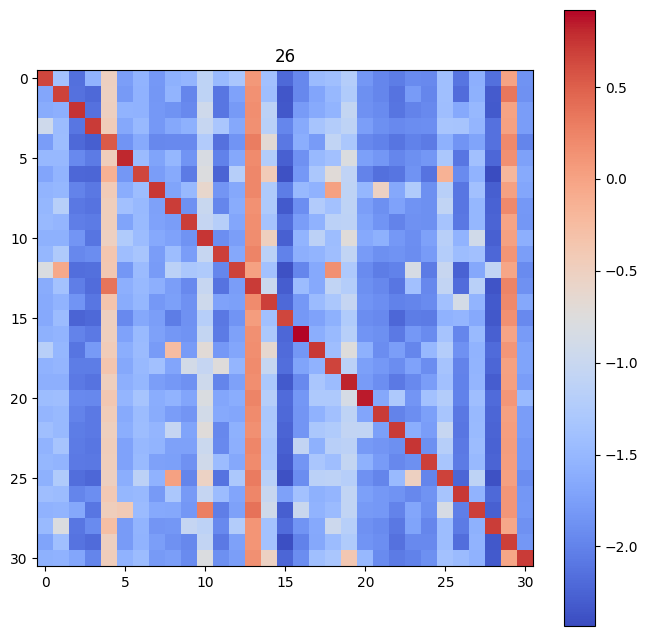

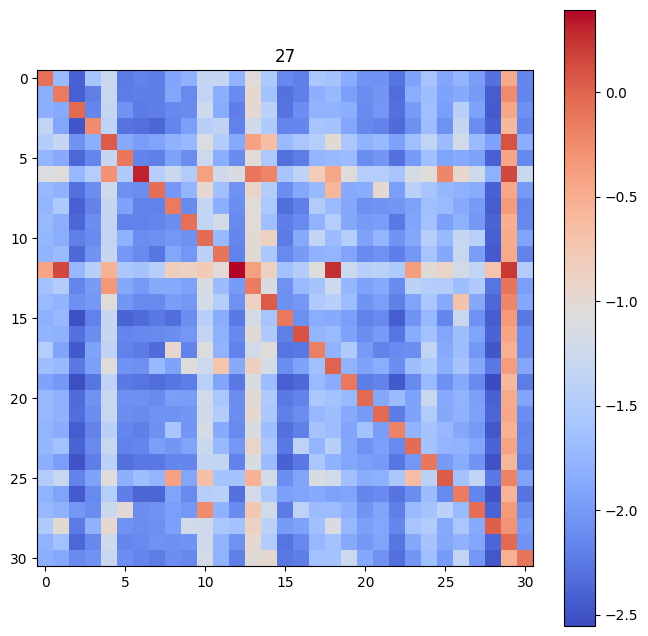

In [161]:
# dataset 0
for i in range(28):
    plot_heatmap(resid_post_1[0,:,:,-1,i],i)

# dataset 1
for i in range(28):
    plot_heatmap(resid_post_1[1,:,:,-1,i],i)